# Merchandise import as predictor of duration returns


This notebook offers the necessary code to replicate the research findings discussed in Macrosynergy's post "Merchandise import as predictor of duration returns". Its primary objective is to inspire readers to explore and conduct additional investigations while also providing a foundation for testing their own unique ideas. 

## Get packages and JPMaQS data

This notebook primarily relies on the standard packages available in the Python data science stack. However, there is an additional package `macrosynergy` that is required for two purposes:

- Downloading JPMaQS data: The `macrosynergy` package facilitates the retrieval of JPMaQS data, which is used in the notebook.
- For the analysis of quantamental data and value propositions: The `macrosynergy` package provides functionality for performing quick analyses of quantamental data and exploring value propositions.

For detailed information and a comprehensive understanding of the `macrosynergy` package and its functionalities, please refer to the ["Introduction to Macrosynergy package"](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php) on the Macrosynergy Academy or visit the following link on [Kaggle](https://www.kaggle.com/code/macrosynergy/introduction-to-macrosynergy-package).

In [ ]:
"""!pip install macrosynergy --upgrade"""

In [1]:
import numpy as np
import pandas as pd
from pandas import Timestamp
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
import os
from datetime import date

import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.signal as mss
import macrosynergy.pnl as msn
from macrosynergy.download import JPMaQSDownload

warnings.simplefilter("ignore")

First, we specify the cross-sections to download, which are used in the notebook. The cross-sections are grouped in lists for further analysis:

In [2]:
cids_g3 = ["EUR", "JPY", "USD"]  # DM large currency areas

# IRS cross-section lists

cids_dmsc_du = ["AUD", "CAD", "CHF", "GBP", "NOK", "NZD", "SEK"]
cids_latm_du = ["CLP", "COP", "MXN"]
cids_emea_du = [
    "CZK",
    "HUF",
    "ILS",
    "PLN",
    "TRY",
    "ZAR",
]
cids_emas_du = ["CNY", "IDR", "INR", "KRW", "MYR", "SGD", "THB", "TWD"]

cids_dmdu = cids_g3 + cids_dmsc_du
cids_emdu = cids_latm_du + cids_emea_du + cids_emas_du
cids_du = cids_dmdu + cids_emdu

cids_dodgy = ["MYR", "TRY"]  # missing or compromised data
cids_dux = list(set(cids_du) - set(cids_dodgy))

cids = cids_dux  # widest set required for this notebook

JPMaQS indicators are conveniently grouped into 6 main categories: Economic Trends, Macroeconomic balance sheets, Financial conditions, Shocks and risk measures, Stylized trading factors, and Generic returns. Each indicator has a separate page with notes, description, availability, statistical measures, and timelines for main currencies. The description of each JPMaQS category is available either under [Macro Quantamental Academy](https://academy.macrosynergy.com/quantamental-indicators/), [JPMorgan Markets](https://markets.jpmorgan.com/#jpmaqs) (password protected).
In particular, the indicators used in this notebook could be found under [Foreign trade trends](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Foreign%20trade%20trends.php?highlight=imports_sa), [Real interest rates](https://academy.macrosynergy.com/academy/Themes/Financial%20conditions/_build/html/notebooks/Real%20interest%20rates.php?highlight=ryldirs02y_nsa), [Inflation expectations (Macrosynergy method)](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Inflation%20expectations.php?highlight=infe1y_ja), [Equity index future returns](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/Equity%20index%20future%20returns.php), and [Duration returns](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/Duration%20returns.php).

In [3]:
# Category tickers

main = [
    "IMPORTS_SA_P3M3ML3AR",
    "IMPORTS_SA_P6M6ML6AR",
    "IMPORTS_SA_P1M1ML12",
    "IMPORTS_SA_P1M1ML12_3MMA",
]

xtra = [
    "RYLDIRS02Y_NSA",
    "RYLDIRS05Y_NSA",
    "INFE1Y_JA",
    "INFE2Y_JA",
    "INFE5Y_JA",
]

rets = [
    "EQXR_NSA",
    "DU02YXR_VT10",
    "DU05YXR_VT10",
]

xcats = main + rets + xtra

# Resultant tickers

tickers = [cid + "_" + xcat for cid in cids for xcat in xcats]
print(f"Maximum number of tickers is {len(tickers)}")

Maximum number of tickers is 300


In [4]:
# Download series from J.P. Morgan DataQuery by tickers

client_id: str = os.getenv("DQ_CLIENT_ID")
client_secret: str = os.getenv("DQ_CLIENT_SECRET")

with JPMaQSDownload(oauth=True, client_id=client_id, client_secret=client_secret) as dq:
    assert dq.check_connection()
    df = dq.download(
        tickers=tickers,
        start_date="2000-01-01",
        suppress_warning=True,
        metrics=["value"],
    )
    assert isinstance(df, pd.DataFrame) and not df.empty

print("Last updated:", date.today())

Timestamp UTC:  2024-03-21 14:33:06
Connection successful!
Some expressions are missing from the downloaded data. Check logger output for complete list.
8 out of 300 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.
Some dates are missing from the downloaded data. 
2 out of 6321 dates are missing.
Last updated: 2024-03-21


In [5]:
dfx = df.copy().sort_values(["cid", "xcat", "real_date"])
dfx.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1734022 entries, 81185 to 1734015
Data columns (total 4 columns):
 #   Column     Dtype         
---  ------     -----         
 0   real_date  datetime64[ns]
 1   cid        object        
 2   xcat       object        
 3   value      float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 66.1+ MB


# Availability

It is important to assess data availability before conducting any analysis. It allows to identify any potential gaps or limitations in the dataset, which can impact the validity and reliability of analysis and ensure that a sufficient number of observations for each selected category and cross-section is available as well as determining the appropriate time periods for analysis. 

In [6]:
msm.missing_in_df(df, xcats=xcats, cids=cids)

Missing xcats across df:  []
Missing cids for DU02YXR_VT10:  []
Missing cids for DU05YXR_VT10:  []
Missing cids for EQXR_NSA:  ['HUF', 'NOK', 'CLP', 'NZD', 'ILS', 'CZK', 'COP', 'IDR']
Missing cids for IMPORTS_SA_P1M1ML12:  []
Missing cids for IMPORTS_SA_P1M1ML12_3MMA:  []
Missing cids for IMPORTS_SA_P3M3ML3AR:  []
Missing cids for IMPORTS_SA_P6M6ML6AR:  []
Missing cids for INFE1Y_JA:  []
Missing cids for INFE2Y_JA:  []
Missing cids for INFE5Y_JA:  []
Missing cids for RYLDIRS02Y_NSA:  []
Missing cids for RYLDIRS05Y_NSA:  []


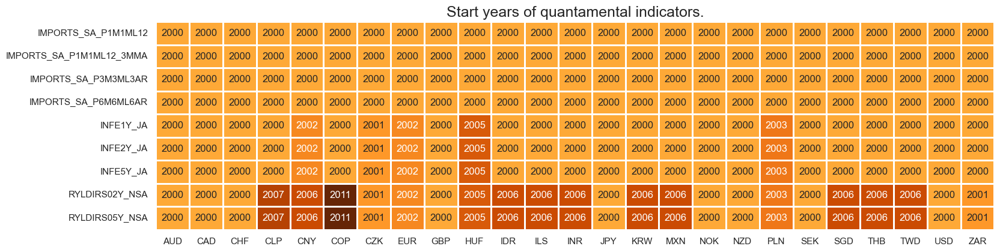

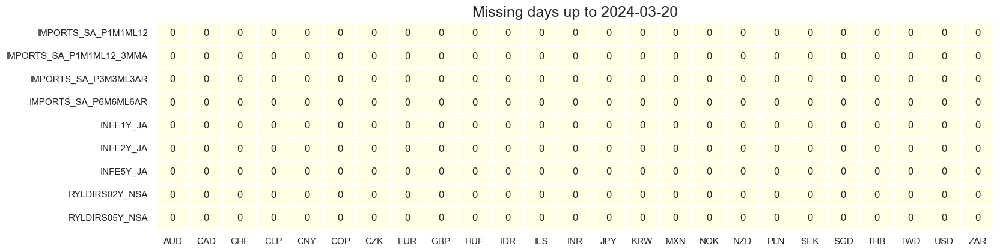

In [7]:
msm.check_availability(df, xcats=main + xtra, cids=cids)

# Transformations and checks

## Features

### Excess import growth

Here we create new categories to measure the excess import growth over 2-year and 5-year nominal yields. These categories will be denoted by the postfixes `v2YLD` or `v5YLD`.

First, we approximate nominal IRS yields as the sum of real yields and inflation expectations, creating new categories `NYLDIRS02Y_NSA` and `NYLDIRS05Y_NSA`. Then, these categories are subtracted from corresponding import trends.

By following this process, you can create new categories to represent the excess import growth over the 2-year and 5-year nominal yields in your dataset.

In [8]:
imps = [
    "IMPORTS_SA_P3M3ML3AR",
    "IMPORTS_SA_P6M6ML6AR",
    "IMPORTS_SA_P1M1ML12_3MMA",
]

calcs = [
    "NYLDIRS02Y_NSA = RYLDIRS02Y_NSA + INFE2Y_JA",  # 2Y nominal yield proxy
    "NYLDIRS05Y_NSA = RYLDIRS05Y_NSA + INFE5Y_JA",  # 5Y nominal yield proxy
]
for m in imps:
    calcs += (
        f"{m}v2YLD = {m} - NYLDIRS02Y_NSA",
    )  # excess import growth over 2-year nominal yield
    calcs += (
        f"{m}v5YLD = {m} - NYLDIRS05Y_NSA",
    )  # excess import growth over 5-year nominal yield

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids)
dfx = msm.update_df(dfx, dfa)

The `macrosynergy` package provides two useful functions, `view_ranges()` and `view_timelines()`, which facilitate the convenient visualization of data for selected indicators and cross-sections. These functions assist in plotting means, standard deviations, and time series of the chosen indicators. In the cell below we plot the newly created excess import growth over 2-year  and 5-year nominal yield:

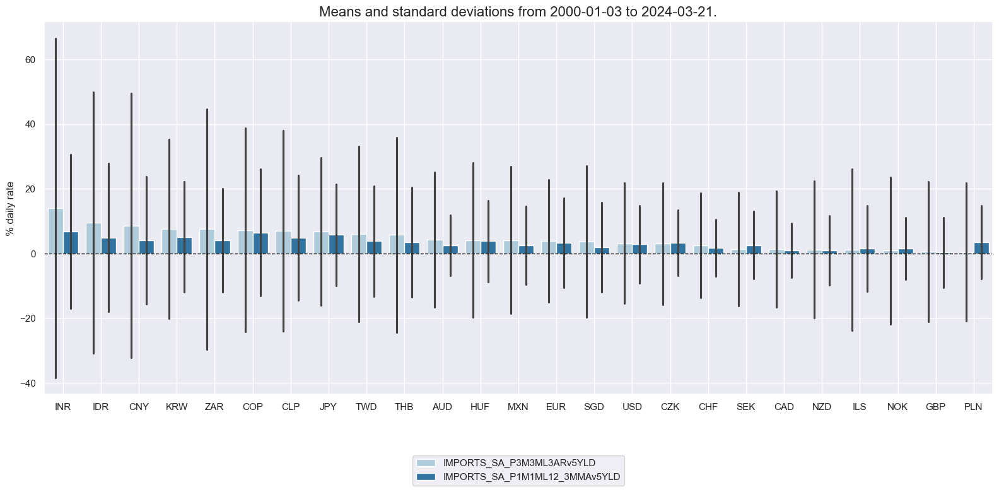

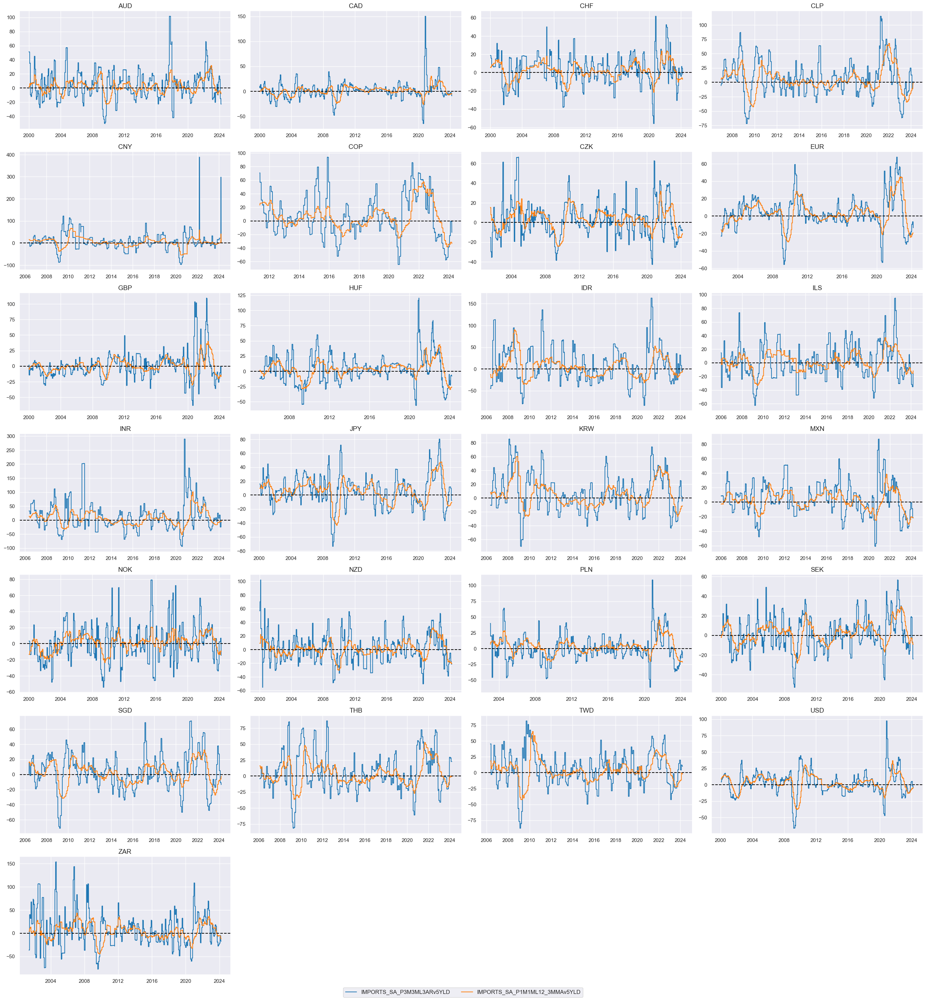

In [9]:
xcatx = [
    "IMPORTS_SA_P3M3ML3ARv5YLD",  # Excess import growth, seasonally and calendar adjusted: % 3m/3m
    "IMPORTS_SA_P1M1ML12_3MMAv5YLD",  # Excess import growth, seasonally and calendar adjusted: % over a year ago, 3-month moving average
]
cidx = cids_dux

msp.view_ranges(
    dfx,
    cids=cidx,
    xcats=xcatx,
    kind="bar",
    sort_cids_by="mean",
    ylab="% daily rate",
    start="2000-01-01",
)
msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    size=(12, 12),
    all_xticks=True,
 )

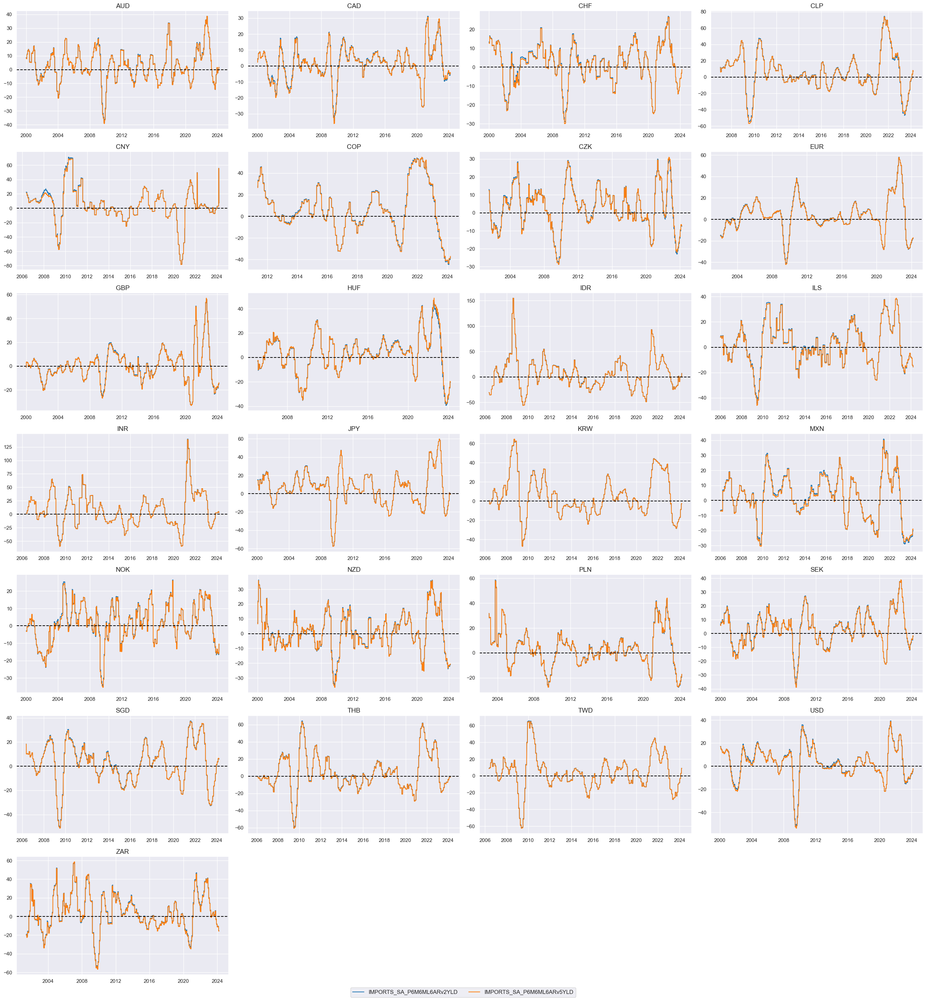

In [10]:
xcatx = [
    "IMPORTS_SA_P6M6ML6ARv2YLD",
    "IMPORTS_SA_P6M6ML6ARv5YLD",
]
cidx = cids_dux

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    size=(12, 12),
    all_xticks=True,
  )

### Import scores

Scoring by normalization of excess import growth is necessary for two reasons:
1. Import growth typically exceeds nominal GDP growth and interest rates. This means that the "neutral" import growth rate relative to nominal yields is not exactly zero and should be estimated based on rolling samples, i.e. considering past experiences at any point in time.
2. Like other economic data, import growth is prone to occasional data distortions that are not indicative of the economic trend. Therefore, one should de-emphasize outliers through winsorization.

Here we z-score excess import growth by using the whole panel set up to every point in time. This means that median and standard deviation are estimated based on all countries, rather than just the experience of an individual country. Thus, we create panel-based z-scores based on expanding windows, capping absolute values at three standard deviations. This normalization is helpful because it provides statistical information on the indicator's “neutral” value. Using z-scores also makes it easier to calculate a composite import growth score later on as an average of the individual growth metrics.

The new categories will get postfix `_ZMP` to indicate that they have been z-scored, on a monthly frequency, based on the whole panel.

In [11]:
cidx = cids_dux
xbms = ["v2YLD", "v5YLD"]
xcatx = [m + xbm for m in imps for xbm in xbms]

dfa = pd.DataFrame(columns=list(dfx.columns))
for xm in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xm,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,  # minimum requirement is 5 years of daily data
        neutral="median",
        pan_weight=1,
        thresh=3,
        postfix="_ZMP",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)
ximps_zs = dfa["xcat"].unique().tolist()

We display the z-scores of the excess import 3 categories of excess growth rates over the 2-year nominal yields on a timeline

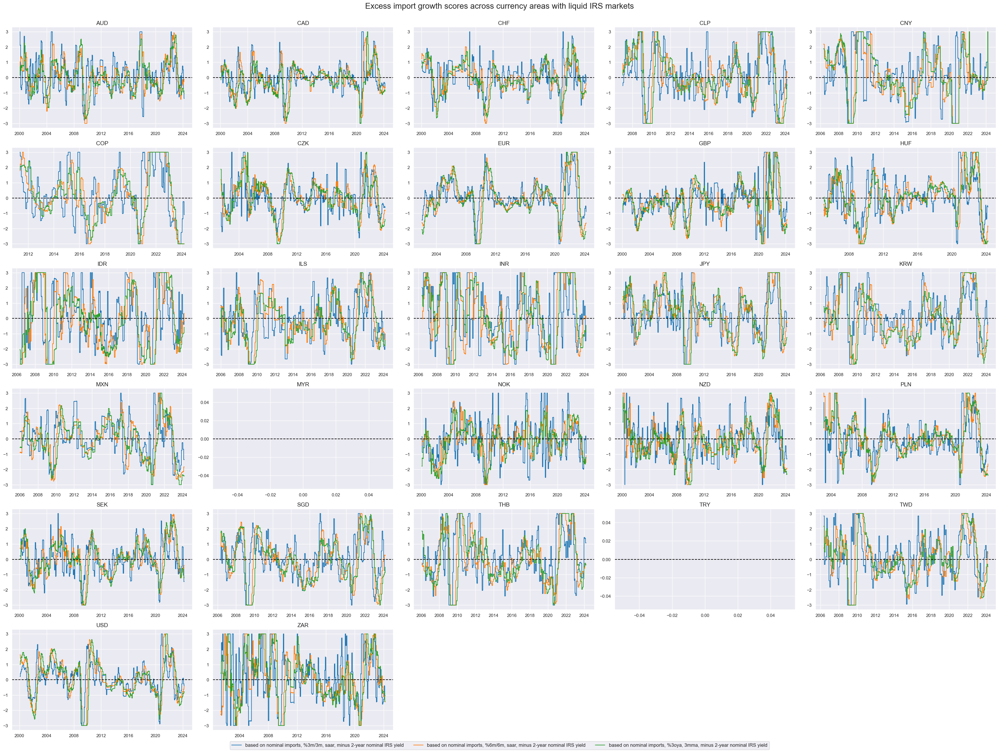

In [12]:
xcatx = [
    "IMPORTS_SA_P3M3ML3ARv2YLD_ZMP",
    "IMPORTS_SA_P6M6ML6ARv2YLD_ZMP",
    "IMPORTS_SA_P1M1ML12_3MMAv2YLD_ZMP",
]
cidx = cids_du


msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=5,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    size=(12, 12),
    all_xticks=True,
    title="Excess import growth scores across currency areas with liquid IRS markets",
    title_fontsize=20,
    xcat_labels=[
        "based on nominal imports, %3m/3m, saar, minus 2-year nominal IRS yield",
        "based on nominal imports, %6m/6m, saar, minus 2-year nominal IRS yield",
        "based on nominal imports, %3oya, 3mma, minus 2-year nominal IRS yield",
    ],
)

With the help of the `linear_composite``()` function from the `macrosynergy` package we create a simple average of corresponding import z-scores over 2 and 5 years and name them `IMPORTSv2YLD_ZMP` and  `IMPORTSv5YLD_ZMP`

In [13]:
cidx = cids_dux
ximps_zmp = [m + xbm + "_ZMP" for m in imps for xbm in xbms]
ximps_zmp_v2yld = [x for x in ximps_zmp if "v2YLD" in x]
ximps_zmi_v5yld = [x for x in ximps_zmp if "v5YLD" in x]

dict_zms = {
    "IMPORTSv2YLD_ZMP": ximps_zmp_v2yld,
    "IMPORTSv5YLD_ZMP": ximps_zmi_v5yld,
}

dfa = pd.DataFrame(columns=list(dfx.columns))
for key, value in dict_zms.items():
    dfaa = msp.linear_composite(
        df=dfx,
        xcats=value,
        cids=cidx,
        complete_xcats=False,
        weights=[1 / len(value)] * len(value),
        signs=[1] * len(value),
        new_xcat=key,
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)
ximps_czms = dfa["xcat"].unique().tolist()

Displaying both import z-scores on a timeline shows that they are almost identical:

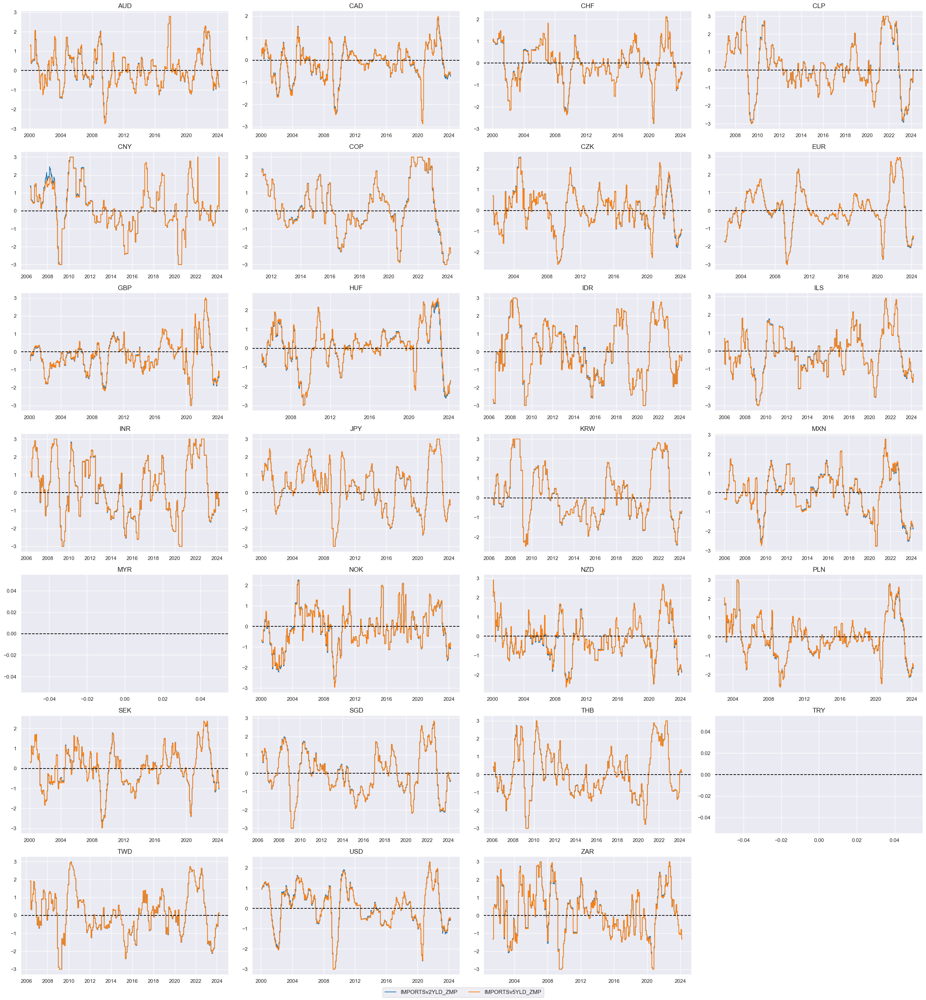

In [14]:
xcatx = ximps_czms
cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    size=(12, 12),
    all_xticks=True,
 )

### Relative import scores

Here we create relative values for import scores. The relative values are calculated by subtracting the mean of the score from the score itself. This is done to ensure that the model is not biased towards any particular value of the score. The name of the indicator will include `_vGLB` postfix for "versus Global Benchmark" indicating that the average of the whole basket is taken for basis.

In [15]:
xcatx = ximps_zs + ximps_czms
cidx = cids_dux

dfa = msp.make_relative_value(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    rel_meth="subtract",
    postfix="vGLB",
)
dfx = msm.update_df(dfx, dfa)

ximps_zsr = dfa["xcat"].unique().tolist()

and here we display both 2 and 5 year excess relative import growth scores on a timeline

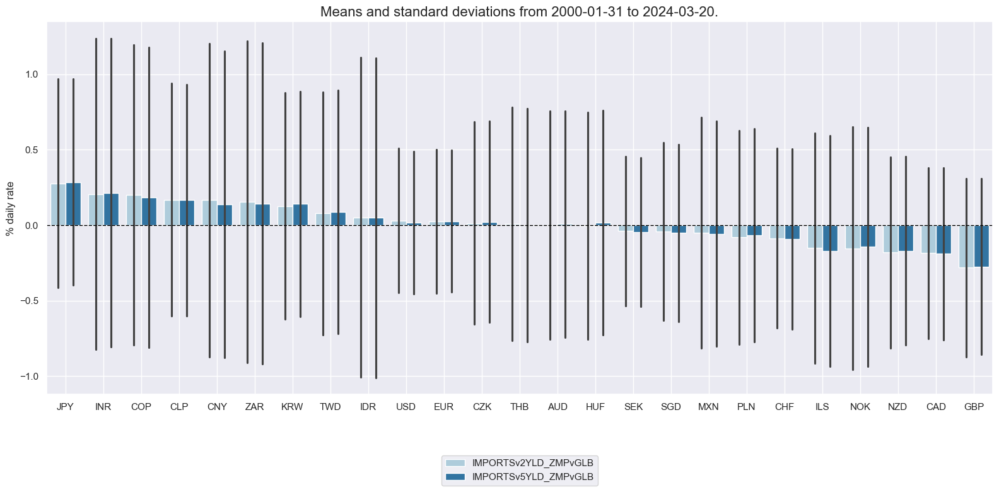

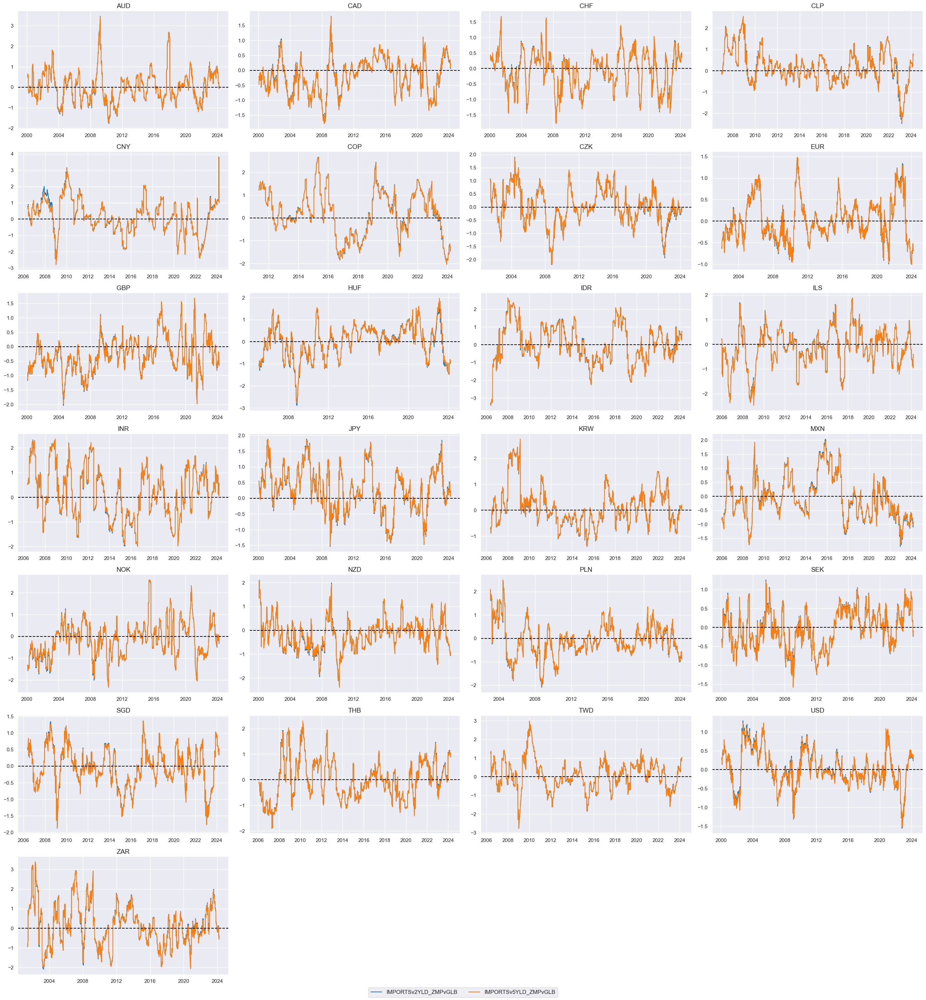

In [16]:
xcatx = [xc + "vGLB" for xc in ximps_czms]
cidx = cids_dux

msp.view_ranges(
    dfx,
    cids=cidx,
    xcats=xcatx,
    kind="bar",
    sort_cids_by="mean",
    ylab="% daily rate",
    start="2000-01-01",
)
msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    size=(12, 12),
    all_xticks=True,
 )

## Targets

#### Directional

The targets of the present analysis are 2-year and 5-year interest rate swap receiver returns for 25 countries with reasonably liquid markets, in particular return on fixed receiver position, % of risk capital on position scaled to 10% (annualized) volatility target, assuming monthly roll: 2-year maturity / 5-year maturity. More on calculation, definition, and conventions [see the downloadable indicator notebook here.](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/Duration%20returns.php)

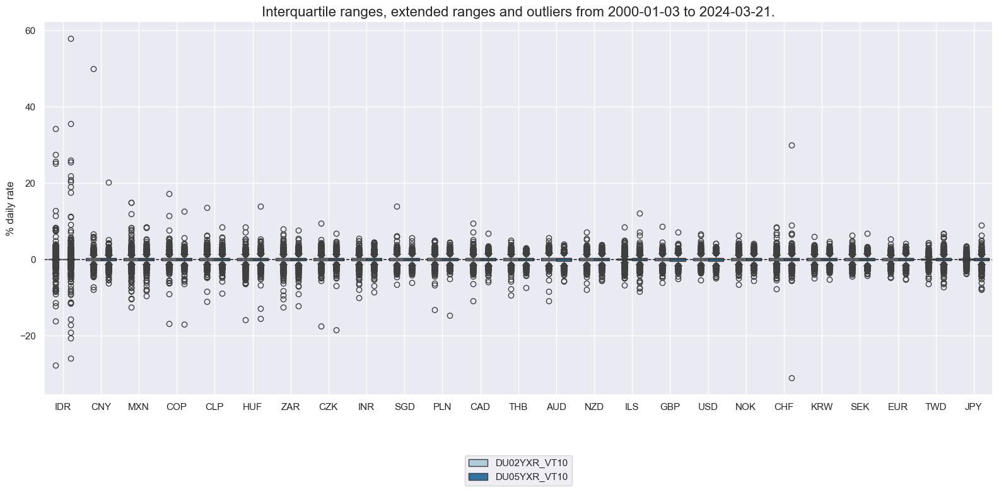

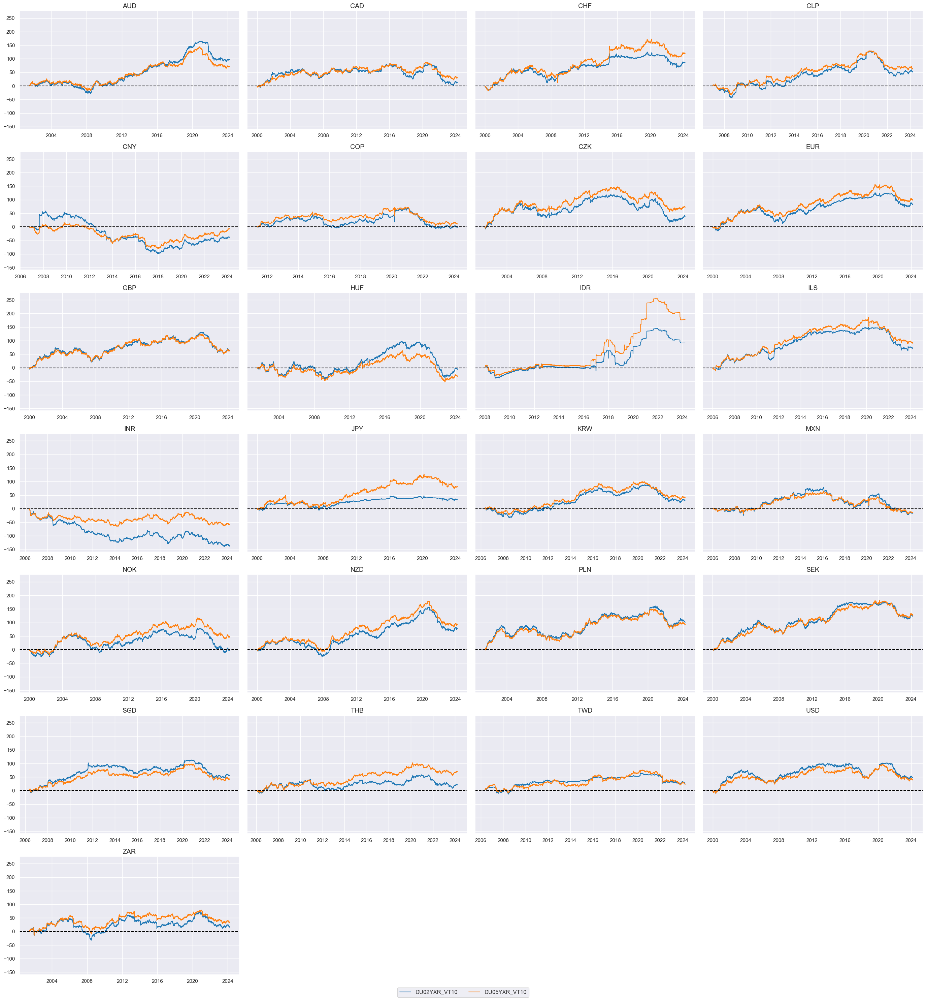

In [17]:
xcatx = ["DU02YXR_VT10", "DU05YXR_VT10"]
cidx = cids_dux

msp.view_ranges(
    dfx,
    cids=cidx,
    xcats=xcatx,
    kind="box",
    sort_cids_by="std",
    ylab="% daily rate",
    start="2000-01-01",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=True,
    start="2000-01-01",
    same_y=True,
    size=(12, 12),
    all_xticks=True,
)

#### Curve (2s-5s flattening returns)

The "2s-5s flattening returns" refer to the returns generated from the flattening of the yield curve between the 2-year and 5-year maturities. Here we define a curve flattening return as the difference between the returns of 5-year and 2-year IRS vol-targeted receiver positions. The resulting value gets a new name `DU05v02XR`. 

In [18]:
cidx = cids_dux
calcs = ["DU05v02XR = DU05YXR_VT10 - DU02YXR_VT10 "]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

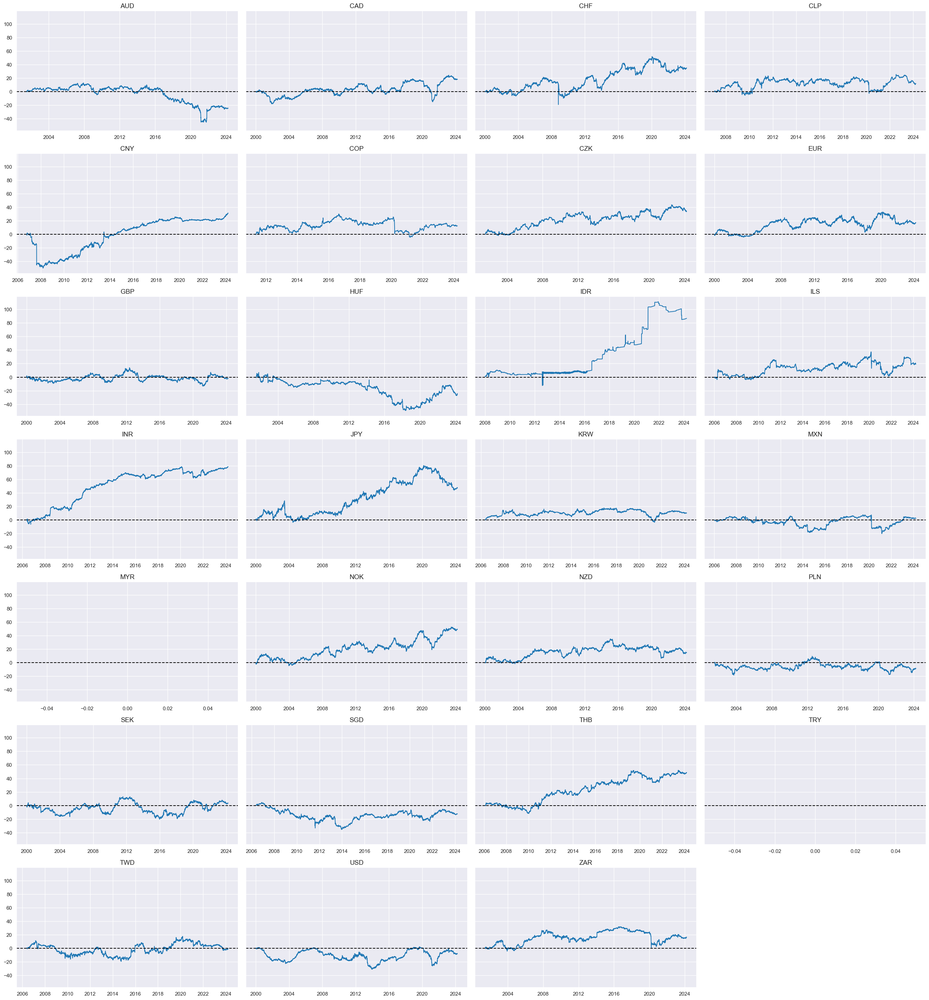

In [19]:
xcatx = ["DU05v02XR"]
cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=True,
    start="2000-01-01",
    same_y=True,
    size=(12, 12),
    all_xticks=True,
)

#### Relative

Here we calculate the relative value of duration returns and give them postfix `vGLB` to indicate "versus Global Benchmark"

In [20]:
xcatx = ["DU02YXR_VT10", "DU05YXR_VT10"]
cidx = cids_dux

dfa = msp.make_relative_value(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    rel_meth="subtract",
    postfix="vGLB",
)
dfx = msm.update_df(dfx, dfa)

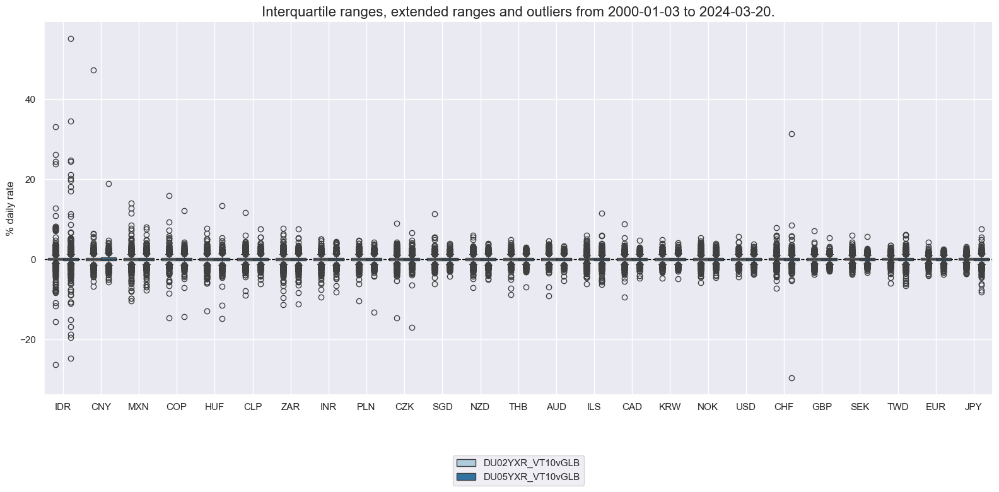

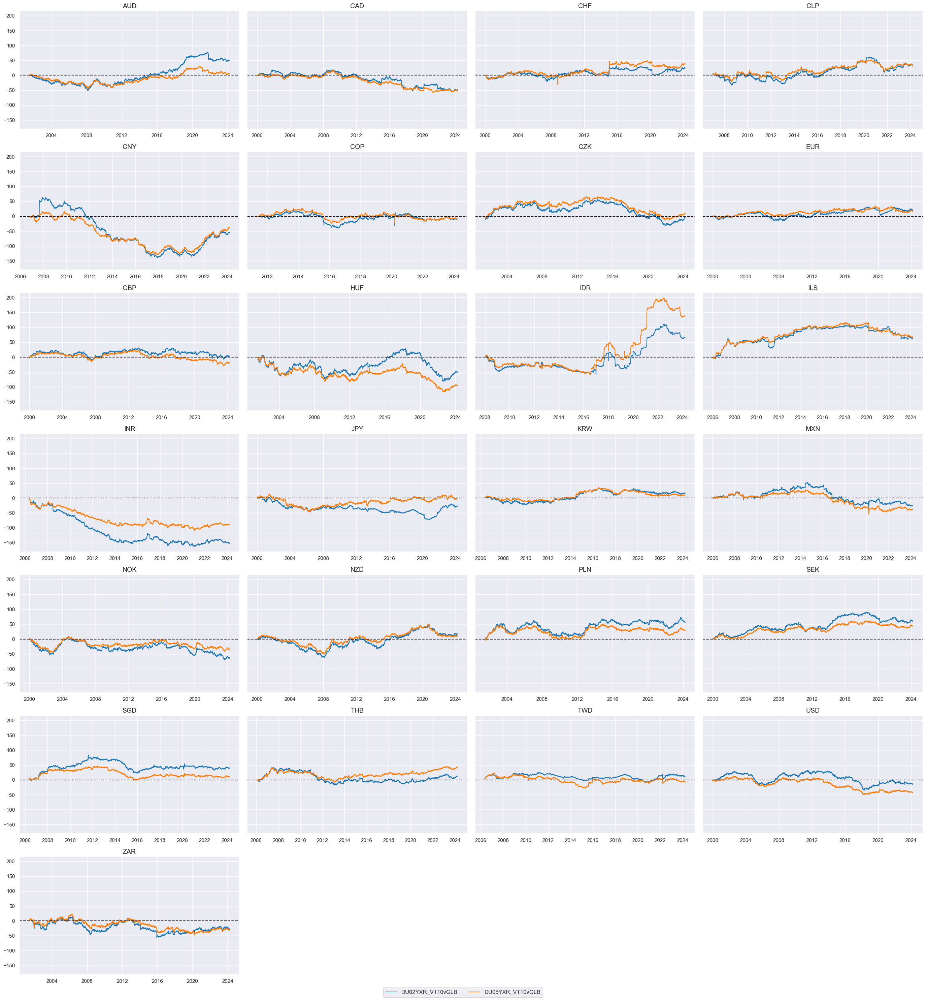

In [21]:
xcatx = ["DU02YXR_VT10vGLB", "DU05YXR_VT10vGLB"]
cidx = cids_dux


msp.view_ranges(
    dfx,
    cids=cidx,
    xcats=xcatx,
    kind="box",
    sort_cids_by="std",
    ylab="% daily rate",
    start="2000-01-01",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=True,
    start="2000-01-01",
    same_y=True,
    size=(12, 12),
    all_xticks=True,
 )

# Value checks

## Import growth

### Directional (2Y)

#### Specs and panel test

We investigate the relationship between the main signal, the composite z-score, with the return on fixed receiver position, % of risk capital on position scaled to 10% (annualized) volatility target. As usual, we lag the explanatory variable by one period and display them on a scatter chart to get the initial impression of the relationship. 

In [22]:
ximps_d2 = [x for x in ximps_zmp if "2YLD" in x]
sigs = ximps_d2
ms = "IMPORTSv2YLD_ZMP"  # main signal
oths = list(set(sigs) - set([ms]))  # other signals

targ = "DU02YXR_VT10"
cidx = cids_dux
start = "2002-01-01"

dict_xmd2 = {
    "sig": ms,
    "rivs": oths,
    "targ": targ,
    "cidx": cidx,
    "black": None,
    "start": start,
    "srr": None,
    "pnls": None,
}

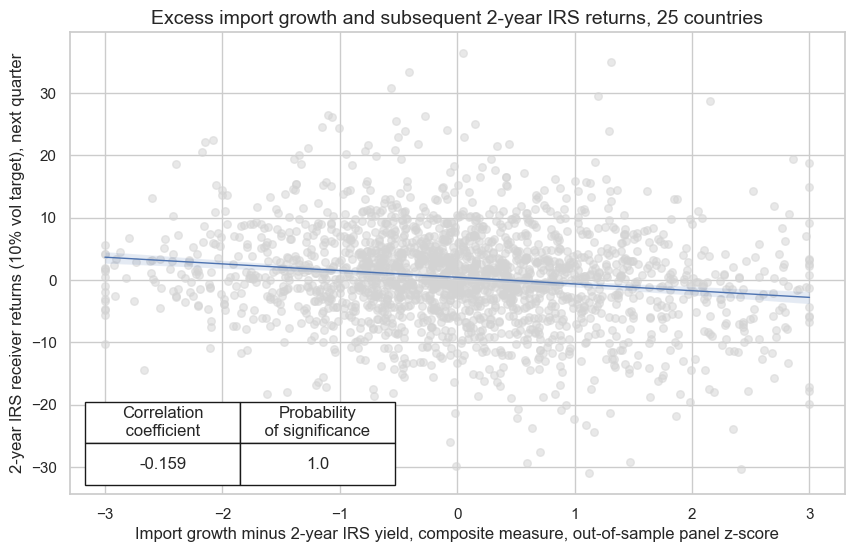

In [23]:
dix = dict_xmd2

sig = dix["sig"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start="2000-01-01",
    blacklist=blax,
    xcat_trims=[200, 40],
)
crx.reg_scatter(
    labels=False,
    coef_box="lower left",
    xlab="Import growth minus 2-year IRS yield, composite measure, out-of-sample panel z-score",
    ylab="2-year IRS receiver returns (10% vol target), next quarter",
    title=f"Excess import growth and subsequent 2-year IRS returns, {len(cids_dux)} countries",
    size=(10, 6),
    prob_est="map",
)

The hypothesis we are checking first is that excess import growth predicts duration returns negatively. Plausibly, this should be relevant for the whole curve. However, concurrent import trends inform more on the monetary policy outlook than long-term growth and inflation and, hence, should be a better predictor for two years than for five years. The relationship between excess import growth and subsequent IRS return is indeed negative as can be seen above, and the probability of significance is near 100%

#### Accuracy and correlation check

With the help of another useful function `SignalReturnRelations` from the `macrosynergy` package we can easily display useful statistics, such as accuracy, balanced accuracy, positive and negative precision. For a description of the output table please refer to the [Introduction to Macrosynergy package](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#signaling). Since the relationship between the signal and the target is negative, we put the signal in negative terms for all analyses by specifying `sig_neg=True` as an option.

In [24]:
dix = dict_xmd2

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    sig_neg=[True] + [True] * len(rivs),
    rets=targ,
    freqs="M",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr

In [25]:
dix = dict_xmd2
srrx = dix["srr"]
display(srrx.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Panel,0.537,0.536,0.505,0.528,0.564,0.509,0.116,0.000,0.073,0.000,0.537
Mean years,0.531,0.513,0.518,0.524,0.542,0.483,0.035,0.337,0.014,0.443,0.509
Positive ratio,0.652,0.609,0.565,0.652,0.739,0.348,0.739,0.478,0.565,0.391,0.609
Mean cids,0.537,0.538,0.504,0.528,0.566,0.510,0.116,0.209,0.074,0.255,0.538
Positive ratio,0.880,0.920,0.440,0.920,0.880,0.600,0.960,0.880,0.880,0.760,0.920


The Summary table below gives a short high-level snapshot of the strength and stability of the main signal and alternative signal relation. As the post states, the balanced accuracy of monthly 2-year IRS return predictions (the average ratio of correct positive and negative return predictions) has been 53.9%. Indeed, positive precision (57.2%) and negative precision (50.5%) have been above par, meaning that positive and negative return predictions have been correct more than half the time.


In [26]:
dix = dict_xmd2
srrx = dix["srr"]
display(srrx.signals_table().sort_index().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
IMPORTS_SA_P1M1ML12_3MMAv2YLD_ZMP_NEG,0.539,0.538,0.513,0.528,0.565,0.511,0.123,0.0,0.073,0.0,0.538
IMPORTS_SA_P3M3ML3ARv2YLD_ZMP_NEG,0.529,0.530,0.497,0.528,0.558,0.501,0.079,0.0,0.049,0.0,0.530
IMPORTS_SA_P6M6ML6ARv2YLD_ZMP_NEG,0.531,0.530,0.512,0.528,0.558,0.503,0.097,0.0,0.059,0.0,0.530
IMPORTSv2YLD_ZMP_NEG,0.537,0.536,0.505,0.528,0.564,0.509,0.116,0.0,0.073,0.0,0.537


Another useful way to visualize positive correlation probabilities based on parametric (Pearson) and non-parametric (Kendall) correlation statistics,  and compare signals between each other, across counties, or years is to use `correlation_bars()` method from the `macrosynergy` package.  

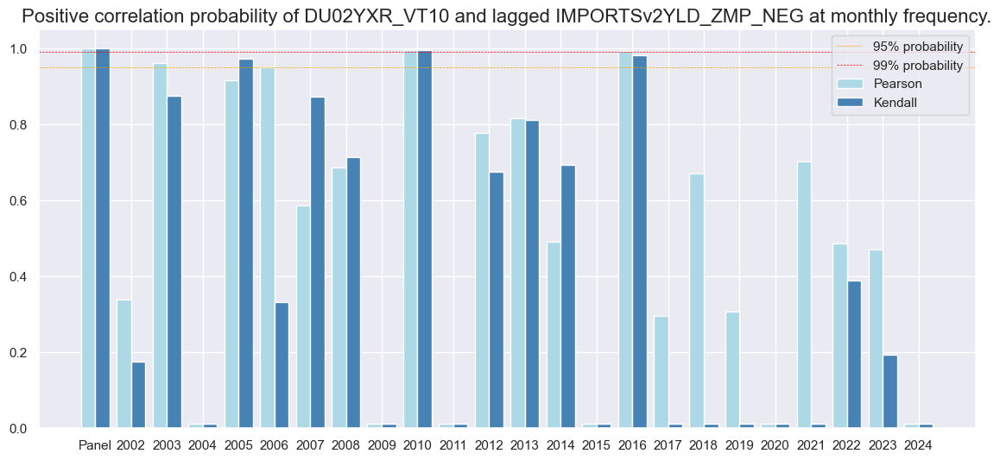

In [27]:
dix = dict_xmd2
srrx = dix["srr"]
srrx.correlation_bars(
    type="years",
    title=None,
    size=(14, 6),
)

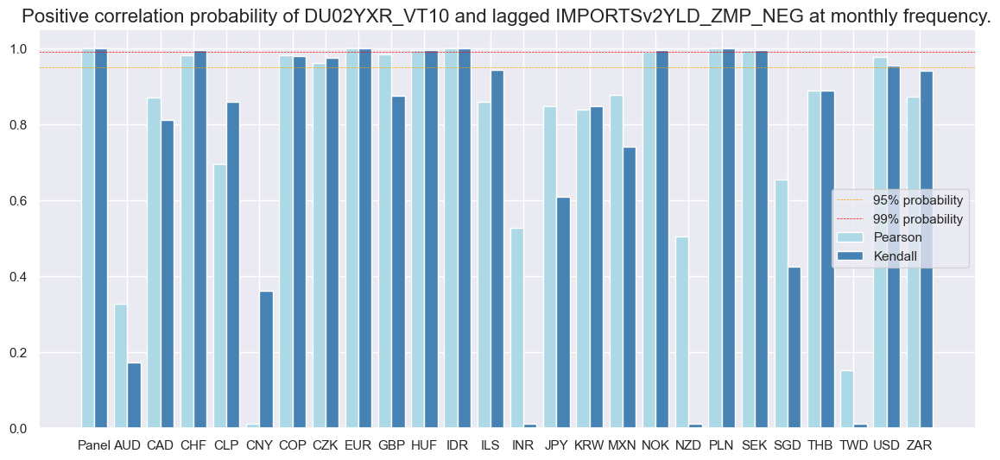

In [28]:
dix = dict_xmd2
srrx = dix["srr"]
srrx.correlation_bars(
    type="cross_section",
    title=None,
    size=(14, 6),
)

#### Naive PnL

Here we calculate a daily PnL for selected composite z-score (signal) `IMPORTSv2YLD_ZMP` and its parts as alternative signals. We create a new PnL series with postfix `_PZN` to indicate that the raw signal has been transformed into z-scores. In the cell below 5 PnLs series are created: for the main signal `IMPORTSv2YLD_ZMP`, for 3 parts of this signal, and Long only PnL.

In [29]:
dix = dict_xmd2

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_DU05YXR_NSA", "USD_EQXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=True,
        sig_op="zn_score_pan",
        thresh=3,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")
dix["pnls"] = naive_pnl

USD_DU05YXR_NSA has no observations in the DataFrame.


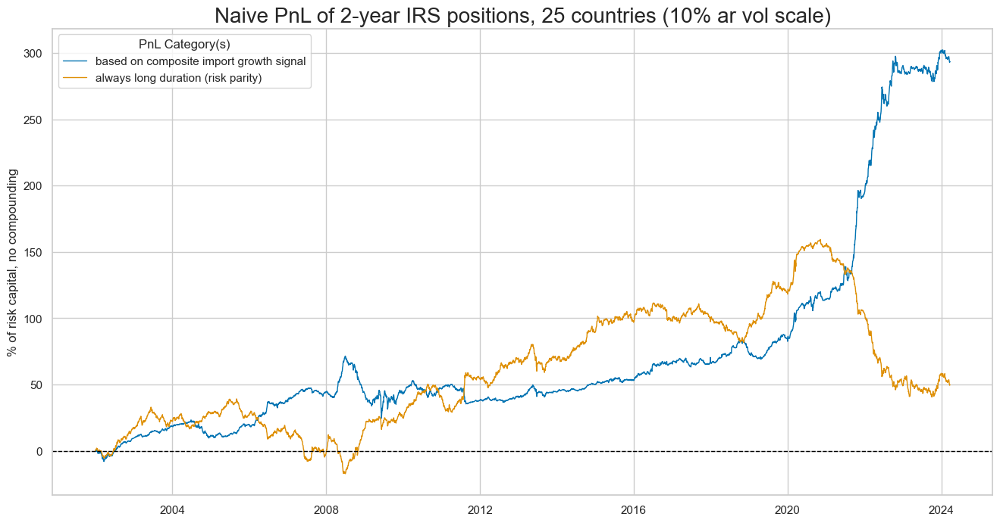

In [30]:
dix = dict_xmd2

start = dix["start"]
cidx = dix["cidx"]

sigx = [dix["sig"]]
naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx] + ["Long only"]
dict_labels = {"IMPORTSv2YLD_ZMP_PZN":  "based on composite import growth signal", 
               "Long only": "always long duration (risk parity)"
               }


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title=f"Naive PnL of 2-year IRS positions, {len(cidx)} countries (10% ar vol scale)",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

The performance has been seasonal, with the most value generated in recent years, benefiting from the economic fluctuations related to the pandemic. 

Here is the same naive PnL for the composite parts of the main signal: `IMPORTS_SA_P6M6ML6ARv2YLD_ZMP`, `IMPORTS_SA_P3M3ML3ARv2YLD_ZMP`, and `IMPORTS_SA_P1M1ML12_3MMAv2YLD_ZMP`

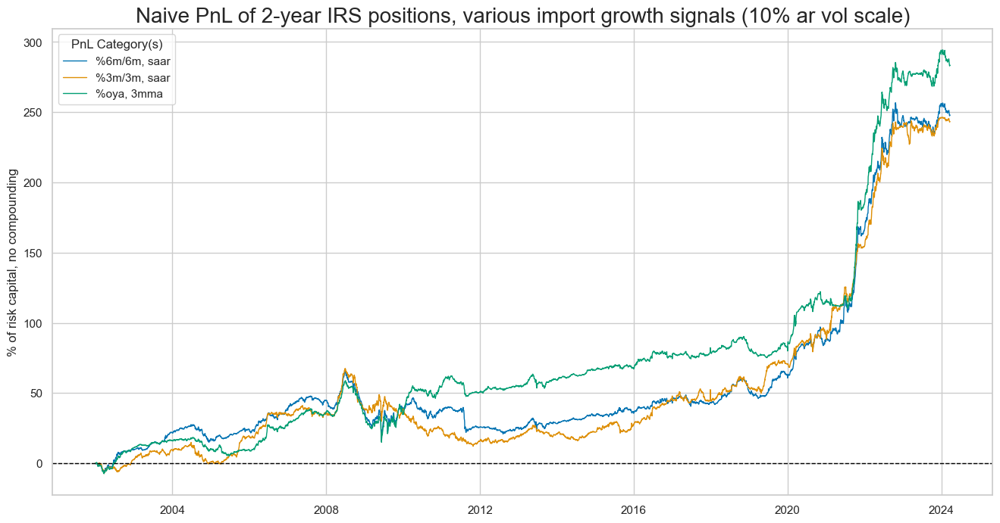

In [31]:
dix = dict_xmd2

start = dix["start"]
sigx = dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]
dict_labels = {"IMPORTS_SA_P3M3ML3ARv2YLD_ZMP_PZN":  "%3m/3m, saar", 
               "IMPORTS_SA_P6M6ML6ARv2YLD_ZMP_PZN": "%6m/6m, saar",
               "IMPORTS_SA_P1M1ML12_3MMAv2YLD_ZMP_PZN": "%oya, 3mma"
               }

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnL of 2-year IRS positions, various import growth signals (10% ar vol scale)",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

In [32]:
dix = dict_xmd2

start = dix["start"]
sigx = [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)
display(df_eval.transpose())

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_EQXR_NSA correl,Traded Months
xcat,,,,,,,,
IMPORTS_SA_P1M1ML12_3MMAv2YLD_ZMP_PZN,12.75788,10.0,1.275788,2.100013,-15.646802,-29.529496,-0.010579,267
IMPORTS_SA_P3M3ML3ARv2YLD_ZMP_PZN,10.950424,10.0,1.095042,1.695933,-18.848949,-28.335352,0.013903,267
IMPORTS_SA_P6M6ML6ARv2YLD_ZMP_PZN,11.164658,10.0,1.116466,1.743639,-18.117501,-30.688805,-0.01406,267
IMPORTSv2YLD_ZMP_PZN,13.21161,10.0,1.321161,2.128049,-17.079492,-30.519009,-0.004073,267


The 22-year Sharpe ratio of a strategy based on the composite import score has been very high at 1.4, with no correlation to the S&P500 returns. Looking across different import growth signals, the least volatile annual growth rates produced the highest prediction accuracy and PnL value. 

The heatmap below shows that the average applied signal values are strongest in times of economic turbulence, such as the pandemic. This fosters the seasonality of the strategy.

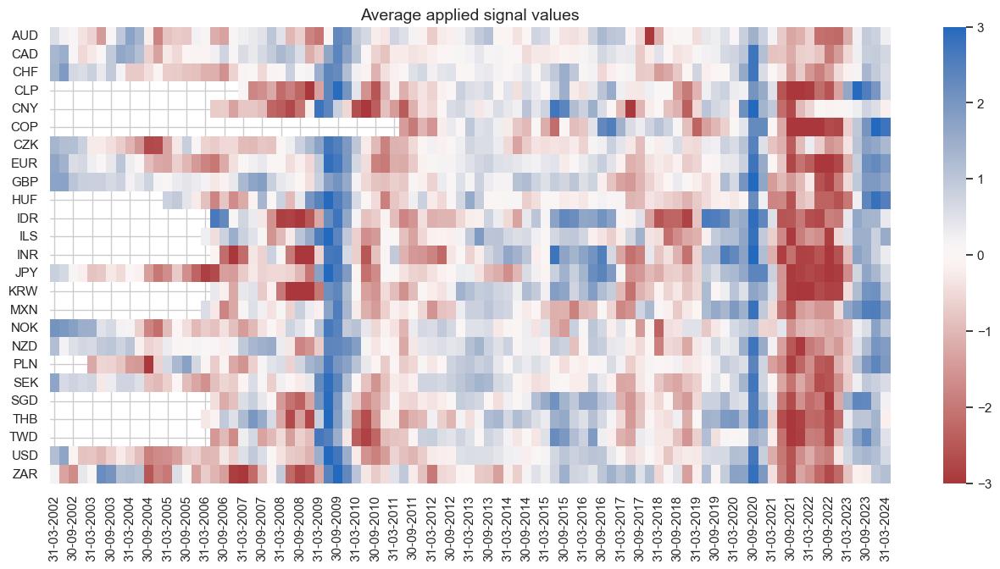

In [33]:
dix = dict_xmd2

start = dix["start"]
sig = dix["sig"]
naive_pnl = dix["pnls"]

naive_pnl.signal_heatmap(pnl_name=sig + "_PZN", freq="q", start=start, figsize=(16, 7))

### Directional (5Y)

#### Specs and panel test

Here we perform the same analysis for imports-based duration strategy for 5-year maturity contracts.  It would have only produced half the value and did so predominantly in the 2020s. Longer-date maturity receivers carry higher risk premia and displayed a greater ratio of positive return months (54.6%), making it harder for a short-biased strategy to create value. However, like the 2-year maturity, the imports-based signal would have highly complemented a long-only strategy.

In [34]:
ximps_d5 = [x for x in ximps_zmp if "5YLD" in x]
sigs = ximps_d5
ms = "IMPORTSv5YLD_ZMP"  # main signal
oths = list(set(sigs) - set([ms]))  # other signals

targ = "DU05YXR_VT10"
cidx = cids_dux
start = "2002-01-01"

dict_xmd5 = {
    "sig": ms,
    "rivs": oths,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "srr": None,
    "pnls": None,
}

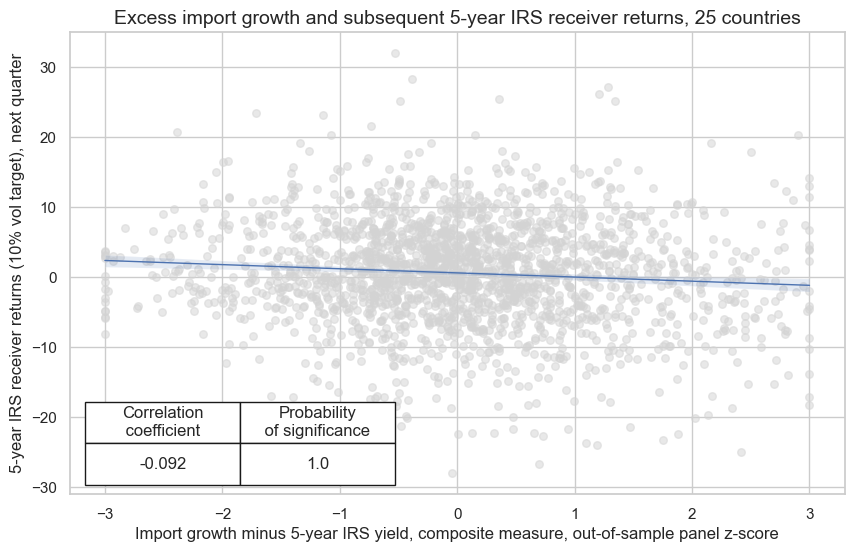

In [35]:
dix = dict_xmd5

sig = dix["sig"]
targ = dix["targ"]
cidx = dix["cidx"]


crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start="2000-01-01",
    xcat_trims=[200, 40],
)
crx.reg_scatter(
    labels=False,
    coef_box="lower left",
    xlab="Import growth minus 5-year IRS yield, composite measure, out-of-sample panel z-score",
    ylab="5-year IRS receiver returns (10% vol target), next quarter",
    title=f"Excess import growth and subsequent 5-year IRS receiver returns, {len(cids_dux)} countries",
    size=(10, 6),
    prob_est="map",
)

#### Accuracy and correlation check

In [36]:
dix = dict_xmd5

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    sig_neg=[True] + [True] * len(rivs),
    rets=targ,
    freqs="M",
    start=start,
)

dix["srr"] = srr

In [37]:
dix = dict_xmd5
srrx = dix["srr"]
display(srrx.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Panel,0.520,0.520,0.503,0.537,0.556,0.483,0.072,0.000,0.040,0.000,0.520
Mean years,0.512,0.500,0.515,0.533,0.532,0.468,0.011,0.418,-0.003,0.387,0.500
Positive ratio,0.609,0.609,0.565,0.652,0.696,0.348,0.652,0.348,0.565,0.304,0.609
Mean cids,0.521,0.520,0.501,0.536,0.556,0.484,0.066,0.461,0.040,0.440,0.520
Positive ratio,0.600,0.600,0.480,0.880,0.840,0.320,0.840,0.520,0.760,0.560,0.600


In [38]:
dix = dict_xmd5
srrx = dix["srr"]
display(srrx.signals_table().sort_index().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
IMPORTS_SA_P1M1ML12_3MMAv5YLD_ZMP_NEG,0.523,0.522,0.511,0.537,0.558,0.486,0.079,0.0,0.040,0.000,0.522
IMPORTS_SA_P3M3ML3ARv5YLD_ZMP_NEG,0.517,0.517,0.495,0.537,0.554,0.480,0.052,0.0,0.028,0.001,0.517
IMPORTS_SA_P6M6ML6ARv5YLD_ZMP_NEG,0.515,0.514,0.509,0.537,0.550,0.478,0.054,0.0,0.026,0.002,0.514
IMPORTSv5YLD_ZMP_NEG,0.520,0.520,0.503,0.537,0.556,0.483,0.072,0.0,0.040,0.000,0.520


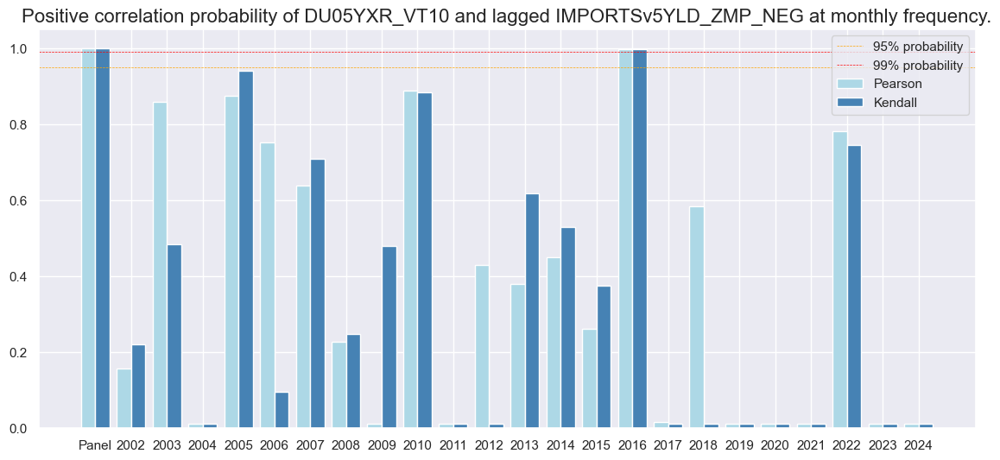

In [82]:
dix = dict_xmd5
srrx = dix["srr"]
srrx.correlation_bars(
    type="years",
    title=None,
    size=(14, 6),
)

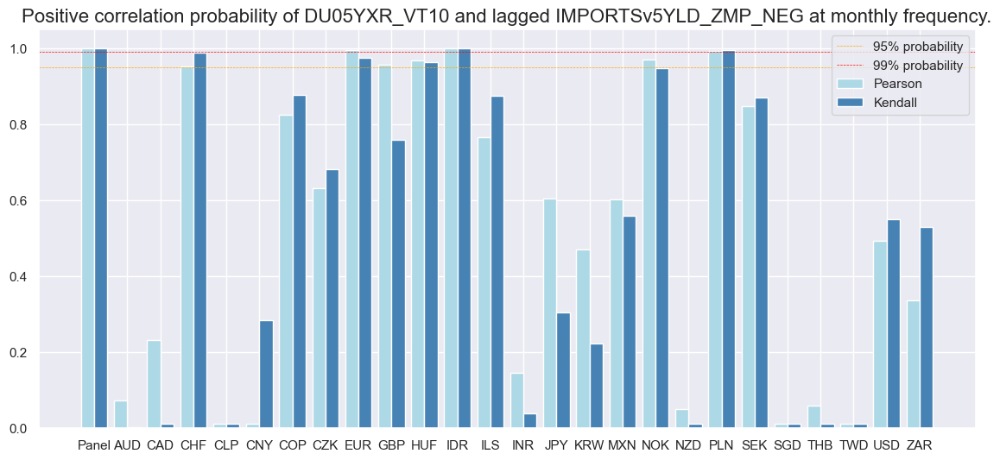

In [40]:
dix = dict_xmd5
srrx = dix["srr"]
srrx.correlation_bars(
    type="cross_section",
    title=None,
    size=(14, 6),
)

#### Naive PnL

In [41]:
dix = dict_xmd5

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    bms=["USD_DU05YXR_NSA", "USD_EQXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=True,
        sig_op="zn_score_pan",
        thresh=3,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")
dix["pnls"] = naive_pnl

USD_DU05YXR_NSA has no observations in the DataFrame.


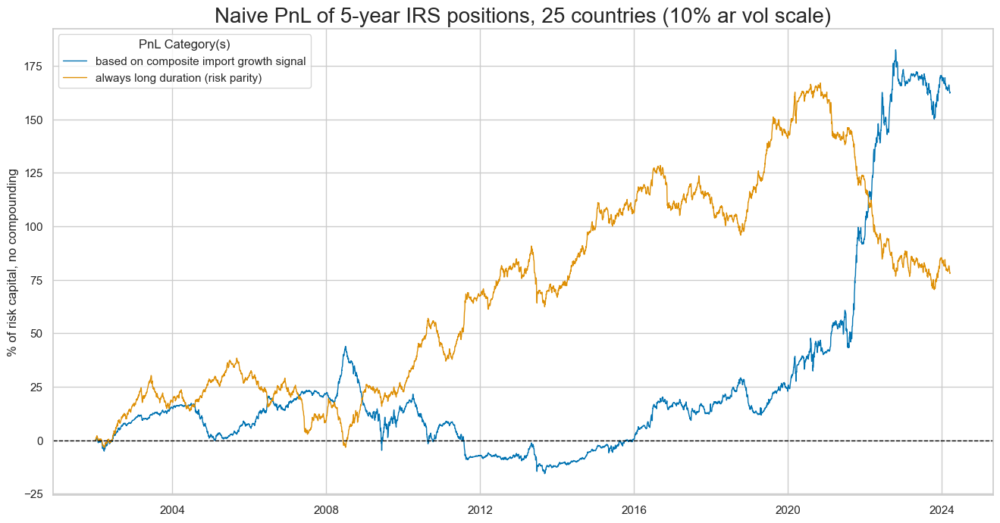

In [42]:
dix = dict_xmd5

start = dix["start"]
cidx = dix["cidx"]

sigx = [dix["sig"]]
naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx] + ["Long only"]
dict_labels = {"IMPORTSv5YLD_ZMP_PZN":  "based on composite import growth signal", 
               "Long only": "always long duration (risk parity)"
               }


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title=f"Naive PnL of 5-year IRS positions, {len(cidx)} countries (10% ar vol scale)",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

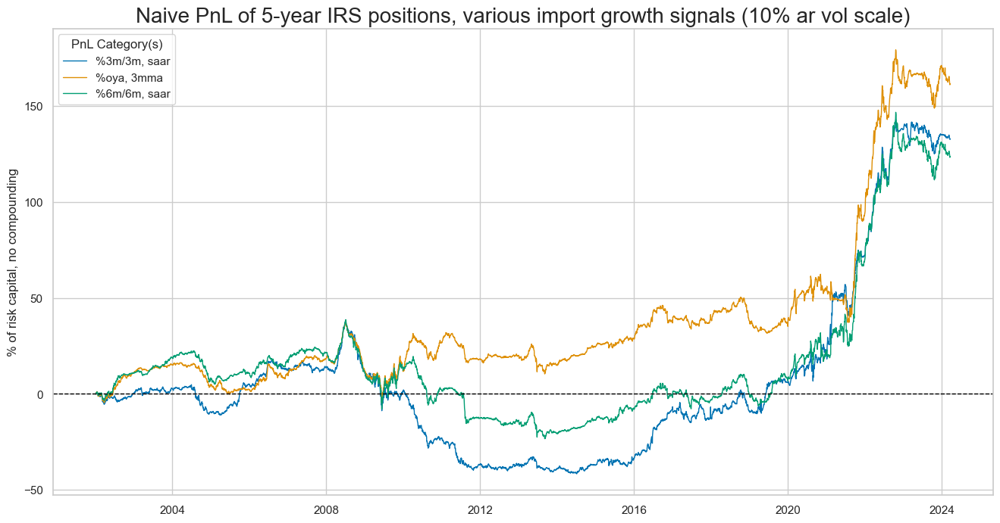

In [43]:
dix = dict_xmd5

start = dix["start"]
sigx = dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]

dict_labels = {"IMPORTS_SA_P3M3ML3ARv5YLD_ZMP_PZN":  "%3m/3m, saar", 
               "IMPORTS_SA_P6M6ML6ARv5YLD_ZMP_PZN": "%6m/6m, saar",
               "IMPORTS_SA_P1M1ML12_3MMAv5YLD_ZMP_PZN": "%oya, 3mma"
               }



naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnL of 5-year IRS positions, various import growth signals (10% ar vol scale)",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

In [44]:
dix = dict_xmd5

start = dix["start"]
sigx = [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)
display(df_eval.transpose())

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_EQXR_NSA correl,Traded Months
xcat,,,,,,,,
IMPORTS_SA_P1M1ML12_3MMAv5YLD_ZMP_PZN,7.26233,10.0,0.726233,1.122203,-14.317473,-25.002214,-0.013211,267
IMPORTS_SA_P3M3ML3ARv5YLD_ZMP_PZN,5.976755,10.0,0.597676,0.882612,-15.884641,-26.077631,0.005796,267
IMPORTS_SA_P6M6ML6ARv5YLD_ZMP_PZN,5.56347,10.0,0.556347,0.827412,-16.625938,-27.222656,-0.01454,267
IMPORTSv5YLD_ZMP_PZN,7.319775,10.0,0.731977,1.103685,-17.529043,-27.498627,-0.008049,267


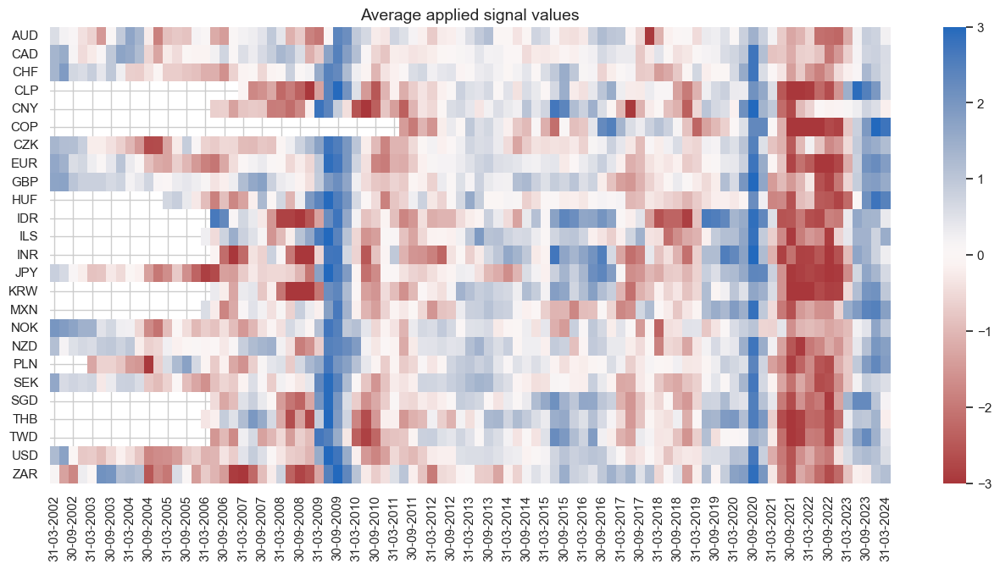

In [45]:
dix = dict_xmd5

start = dix["start"]
sig = dix["sig"]
naive_pnl = dix["pnls"]

naive_pnl.signal_heatmap(pnl_name=sig + "_PZN", freq="q", start=start, figsize=(16, 7))

### Curve (5y versus 2y flattening)

#### Specs and panel test

The hypothesis is that strong import growth predicts swap curve-flattening through a more hawkish monetary policy stance in the near term. This hypothesis relies on the transitory nature of import growth information and the expectations that central banks defend their inflation targets in the long run. Here we define a curve flattening return as the difference between the returns of 5-year and 2-year IRS vol-targeted receiver positions.

In [46]:
ximps_d2 = [x for x in ximps_zmp if "2YLD" in x]
sigs = ximps_d2
ms = "IMPORTSv2YLD_ZMP"  # main signal
oths = list(set(sigs) - set([ms]))  # other signals

targ = "DU05v02XR"
cidx = cids_dux
start = "2002-01-01"

dict_xm52 = {
    "sig": ms,
    "rivs": oths,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "srr": None,
    "pnls": None,
}

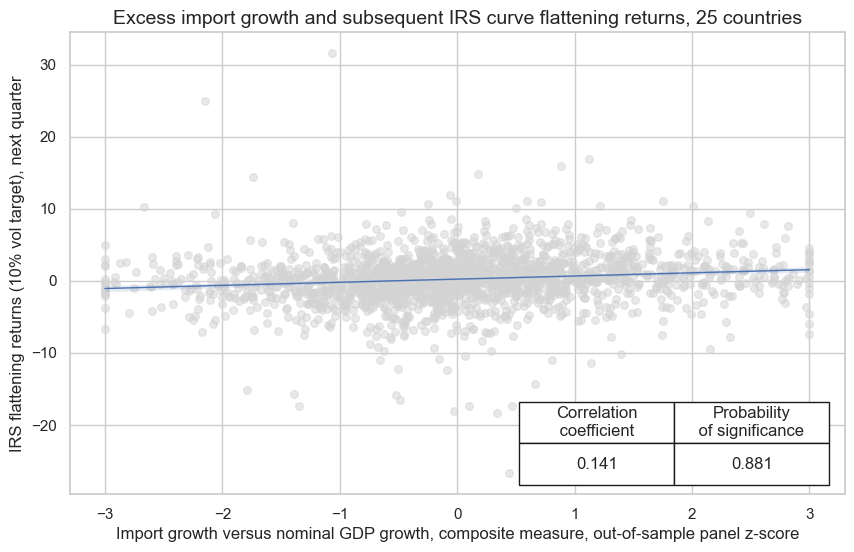

In [47]:
dix = dict_xm52

sig = dix["sig"]
targ = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
    xcat_trims=[200, 40],
)
crx.reg_scatter(
    labels=False,
    coef_box="lower right",
    xlab="Import growth versus nominal GDP growth, composite measure, out-of-sample panel z-score",
    ylab="IRS flattening returns (10% vol target), next quarter",
    title=f"Excess import growth and subsequent IRS curve flattening returns, {len(cids_dux)} countries",
    size=(10, 6),
    prob_est="map",
)

Empirical panel analysis confirms a positive relationship between the composite import growth score and subsequent monthly or quarterly curve flattening returns. The forward correlation coefficient is comparable in size to outright duration return predictions. However, the Macrosynergy panel test only assigns 83% significance to the quarterly relation, reflecting the high cross-country correlation of curve-based returns.

#### Accuracy and correlation check

In [48]:
dix = dict_xm52

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    rets=targ,
    freqs="M",
    start=start,
)

dix["srr"] = srr

In [49]:
dix = dict_xm52
srrx = dix["srr"]
display(srrx.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Panel,0.539,0.539,0.495,0.538,0.578,0.501,0.092,0.000,0.081,0.000,0.540
Mean years,0.538,0.529,0.482,0.542,0.557,0.500,0.056,0.239,0.047,0.242,0.518
Positive ratio,0.696,0.696,0.435,0.739,0.739,0.435,0.783,0.652,0.783,0.652,0.696
Mean cids,0.538,0.539,0.496,0.539,0.578,0.500,0.105,0.242,0.082,0.214,0.539
Positive ratio,0.840,0.840,0.520,0.760,1.000,0.480,0.920,0.800,0.960,0.800,0.840


In [50]:
dix = dict_xm52
srrx = dix["srr"]
display(srrx.signals_table().sort_index().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
IMPORTS_SA_P1M1ML12_3MMAv2YLD_ZMP,0.541,0.542,0.487,0.538,0.581,0.503,0.090,0.0,0.084,0.0,0.543
IMPORTS_SA_P3M3ML3ARv2YLD_ZMP,0.520,0.520,0.503,0.538,0.558,0.482,0.057,0.0,0.048,0.0,0.520
IMPORTS_SA_P6M6ML6ARv2YLD_ZMP,0.538,0.539,0.488,0.538,0.578,0.500,0.089,0.0,0.077,0.0,0.540
IMPORTSv2YLD_ZMP,0.539,0.539,0.495,0.538,0.578,0.501,0.092,0.0,0.081,0.0,0.540


Predictive accuracy for curve flattening returns has been similar in value to directional 2-year returns, with balanced accuracy at 53.9%.

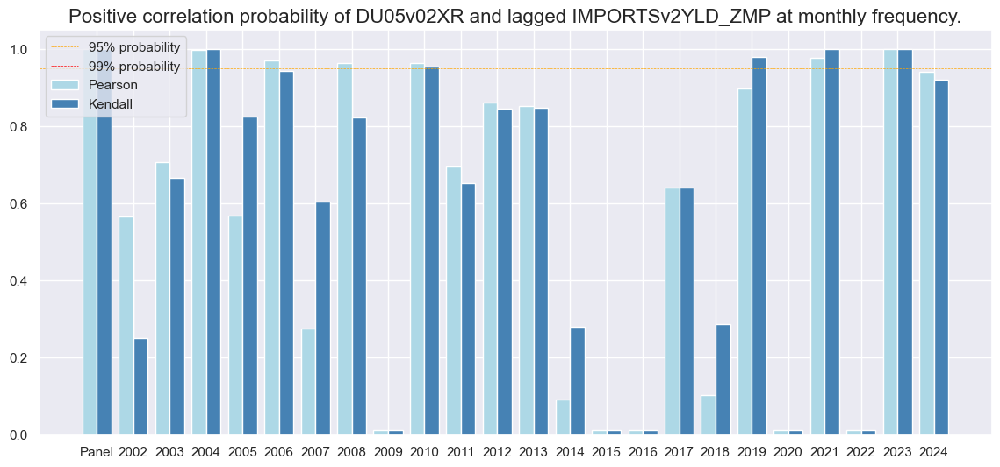

In [51]:
dix = dict_xm52
srrx = dix["srr"]
srrx.correlation_bars(
    type="years",
    title=None,
    size=(14, 6),
)

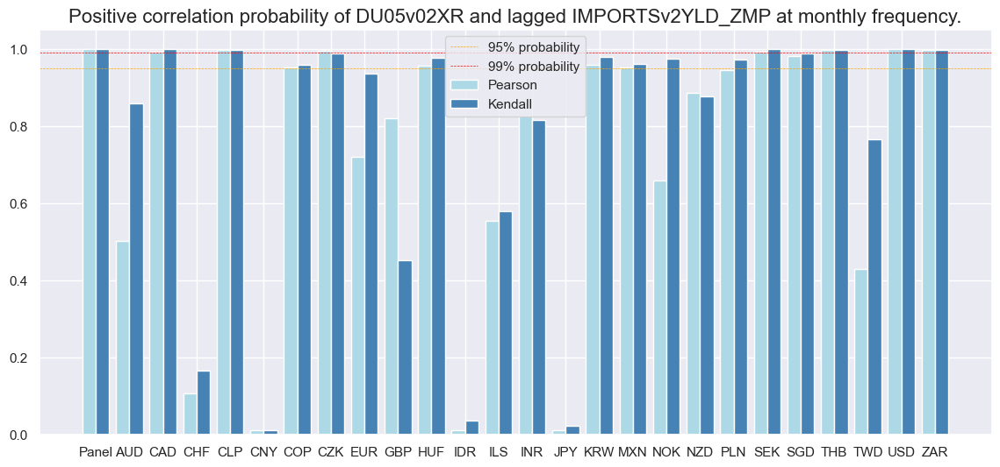

In [52]:
dix = dict_xm52
srrx = dix["srr"]
srrx.correlation_bars(
    type="cross_section",
    title=None,
    size=(14, 6),
)

#### Naive PnL

In [53]:
dix = dict_xm52

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    bms=["USD_DU05YXR_NSA", "USD_EQXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=3,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")
dix["pnls"] = naive_pnl

USD_DU05YXR_NSA has no observations in the DataFrame.


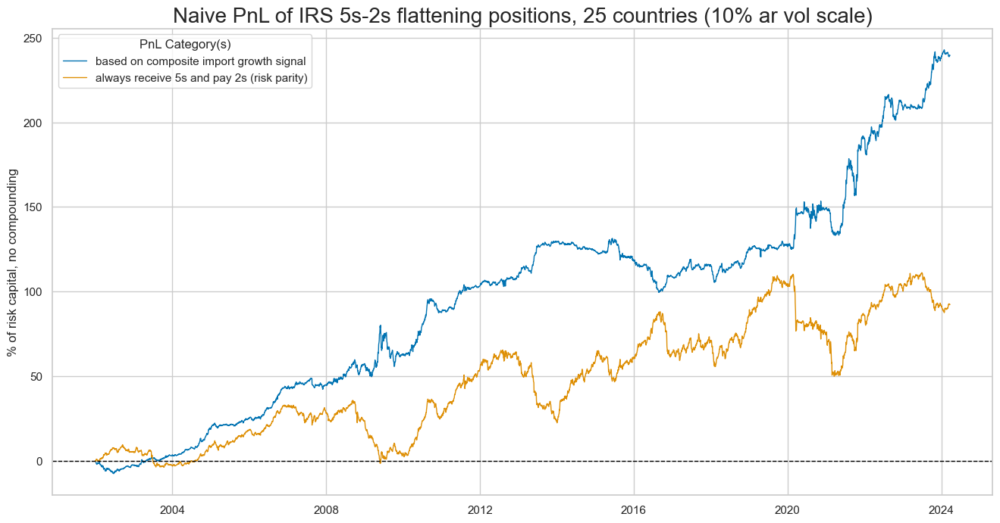

In [54]:
dix = dict_xm52

start = dix["start"]
cidx = dix["cidx"]

sigx = [dix["sig"]]
naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx] + ["Long only"]

dict_labels = {"IMPORTSv2YLD_ZMP_PZN":  "based on composite import growth signal", 
               "Long only": "always receive 5s and pay 2s (risk parity)"
               }



naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title=f"Naive PnL of IRS 5s-2s flattening positions, {len(cidx)} countries (10% ar vol scale)",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

Like the directional strategy, the imports-based curve strategy has performed well in economic turbulences.

In [55]:
pnls

['IMPORTSv2YLD_ZMP_PZN', 'Long only']

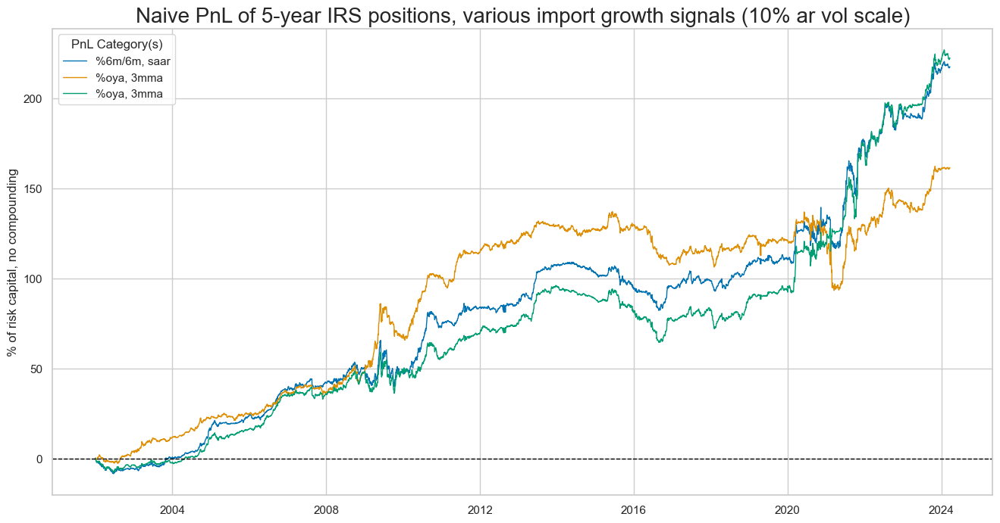

In [56]:
dix = dict_xm52

start = dix["start"]
sigx = dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]

dict_labels = {"IMPORTS_SA_P3M3ML3ARv2YLD_ZMP_PZN":  "%oya, 3mma", 
               "IMPORTS_SA_P6M6ML6ARv2YLD_ZMP_PZN": "%6m/6m, saar",
               "IMPORTS_SA_P1M1ML12_3MMAv2YLD_ZMP_PZN": "%oya, 3mma"
               }



naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnL of 5-year IRS positions, various import growth signals (10% ar vol scale)",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

All import growth rates would have produced significant and roughly similar economic value as a scored trading signal for curve positions.

In [57]:
dix = dict_xm52

start = dix["start"]
sigx = [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)
display(df_eval.transpose())

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_EQXR_NSA correl,Traded Months
xcat,,,,,,,,
IMPORTS_SA_P1M1ML12_3MMAv2YLD_ZMP_PZN,10.007779,10.0,1.000778,1.46663,-18.970662,-13.562298,0.00409,267
IMPORTS_SA_P3M3ML3ARv2YLD_ZMP_PZN,7.260168,10.0,0.726017,1.054448,-25.832647,-38.990661,0.010213,267
IMPORTS_SA_P6M6ML6ARv2YLD_ZMP_PZN,9.792046,10.0,0.979205,1.431698,-15.753958,-19.603914,0.001647,267
IMPORTSv2YLD_ZMP_PZN,10.7848,10.0,1.07848,1.62554,-17.928399,-18.516098,0.006194,267


### Relative (2y)

#### Specs and panel test

The hypothesis is that countries with stronger imports will subsequently experience lower duration returns than those with weaker import growth. Differentials in local-currency import growth are seen as indicative of differences in growth and inflation and, hence, for resultant differences in changes in monetary policy. The monetary policy links suggest that predictive power should be stronger for relative 2-year IRS receiver returns than for relative 5-year IRS receiver returns.  The term “relative” here refers to the value of the local currency area minus the average value for all tradable currency areas at the given time period.

In [58]:
ximps_d2 = [x for x in ximps_zmp if "2YLD" in x]
for_sigs = ximps_d2
sigs = [s + "vGLB" for s in for_sigs]
ms = "IMPORTSv2YLD_ZMPvGLB"  # main signal
oths = list(set(sigs) - set([ms]))  # other signals

targ = "DU02YXR_VT10vGLB"
cidx = cids_dux
start = "2002-01-01"

dict_imr2 = {
    "sig": ms,
    "rivs": oths,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "srr": None,
    "pnls": None,
}

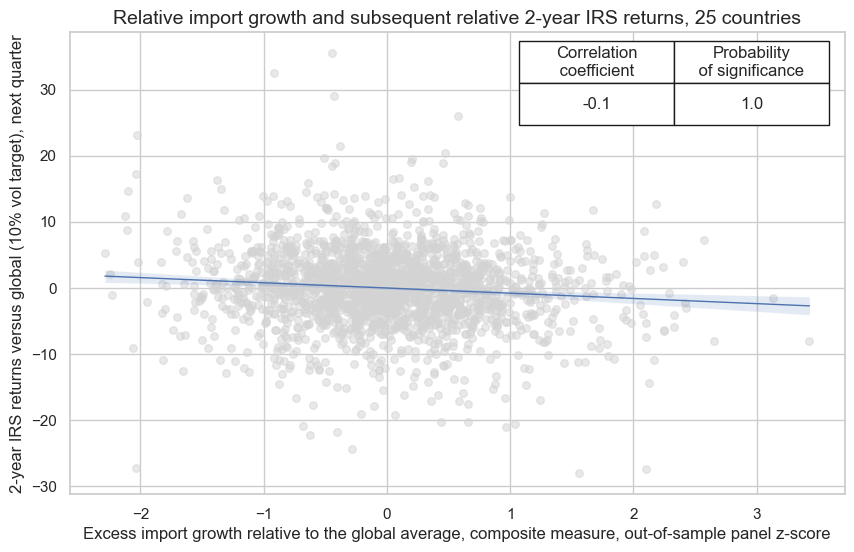

In [59]:
dix = dict_imr2

sig = dix["sig"]
targ = dix["targ"]
cidx = dix["cidx"]


crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start="2000-01-01",
    xcat_trims=[200, 40],  # extreme value distorts scatter
)
crx.reg_scatter(
    labels=False,
    coef_box="upper right",
    xlab="Excess import growth relative to the global average, composite measure, out-of-sample panel z-score",
    ylab="2-year IRS returns versus global (10% vol target), next quarter",
    title=f"Relative import growth and subsequent relative 2-year IRS returns, {len(cidx)} countries",
    size=(10, 6),
    prob_est="map",
)

The Macrosynergy panel tests suggest that the relationship is negative and highly significant with a probability of nearly 100% for either monthly or quarterly frequency.

#### Accuracy and correlation check

In [60]:
dix = dict_imr2

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    sig_neg=[True] + [True] * len(rivs),
    rets=targ,
    freqs="M",
    start=start,
)

dix["srr"] = srr

In [61]:
dix = dict_imr2
srrx = dix["srr"]
display(srrx.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Panel,0.519,0.519,0.519,0.511,0.529,0.508,0.065,0.000,0.039,0.000,0.519
Mean years,0.521,0.521,0.516,0.511,0.530,0.511,0.075,0.324,0.041,0.390,0.521
Positive ratio,0.609,0.652,0.522,0.565,0.696,0.609,0.870,0.652,0.696,0.522,0.652
Mean cids,0.519,0.518,0.516,0.511,0.529,0.508,0.058,0.359,0.040,0.322,0.518
Positive ratio,0.720,0.720,0.680,0.560,0.640,0.600,0.760,0.560,0.760,0.560,0.720


In [62]:
dix = dict_imr2
srrx = dix["srr"]
display(srrx.signals_table().sort_index().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
IMPORTS_SA_P1M1ML12_3MMAv2YLD_ZMPvGLB_NEG,0.513,0.513,0.510,0.511,0.524,0.502,0.065,0.000,0.033,0.000,0.513
IMPORTS_SA_P3M3ML3ARv2YLD_ZMPvGLB_NEG,0.517,0.517,0.521,0.511,0.527,0.506,0.038,0.003,0.028,0.001,0.517
IMPORTS_SA_P6M6ML6ARv2YLD_ZMPvGLB_NEG,0.517,0.516,0.517,0.511,0.527,0.506,0.060,0.000,0.032,0.000,0.516
IMPORTSv2YLD_ZMPvGLB_NEG,0.519,0.519,0.519,0.511,0.529,0.508,0.065,0.000,0.039,0.000,0.519


The balanced accuracy of the prediction of monthly return directions has been lower than in the case of directional signals. For the 2-year relative IRS receiver returns it has been at 51.4%. Lower precision is a common feature of relative economic signals because data are not fully comparable across countries and a part of the signal reflects irrelevant differences in data conventions and economic structure.

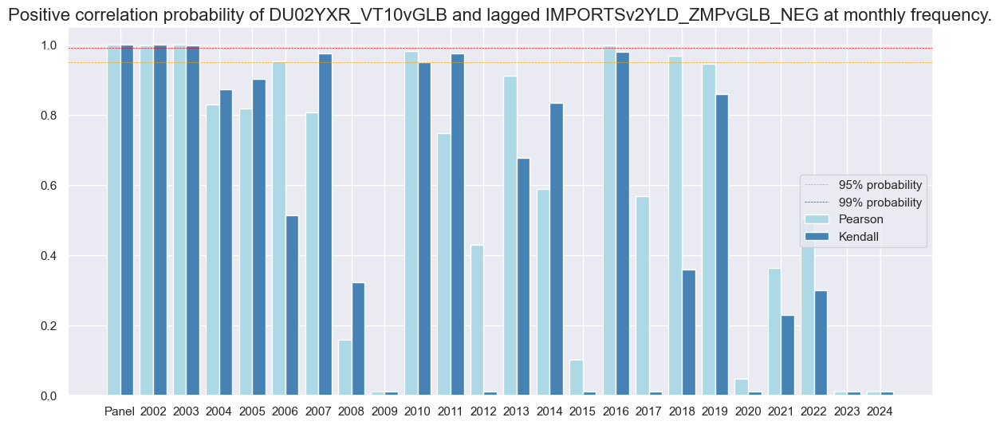

In [63]:
dix = dict_imr2
srrx = dix["srr"]
srrx.correlation_bars(
    type="years",
    title=None,
    size=(14, 6),
)

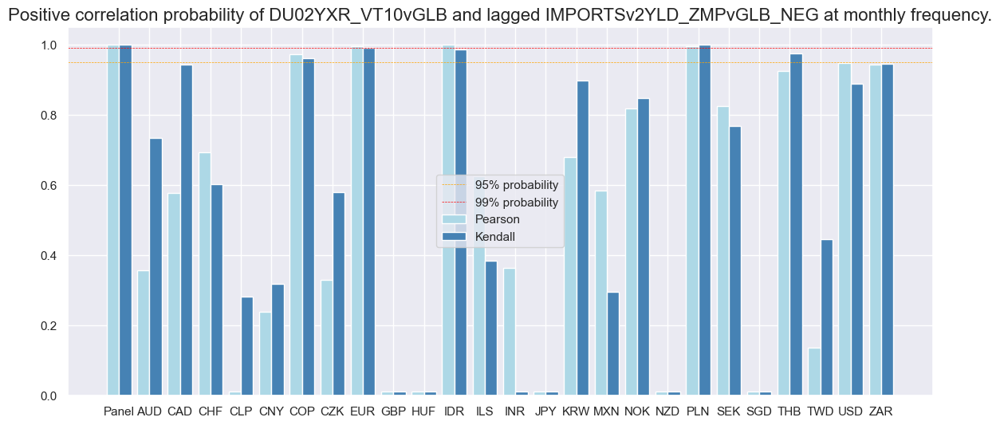

In [64]:
dix = dict_imr2
srrx = dix["srr"]
srrx.correlation_bars(
    type="cross_section",
    title=None,
    size=(14, 6),
)

#### Naive PnL

In [65]:
dix = dict_imr2

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    bms=["USD_DU05YXR_NSA", "USD_EQXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=True,
        sig_op="zn_score_pan",
        thresh=3,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

dix["pnls"] = naive_pnl

USD_DU05YXR_NSA has no observations in the DataFrame.


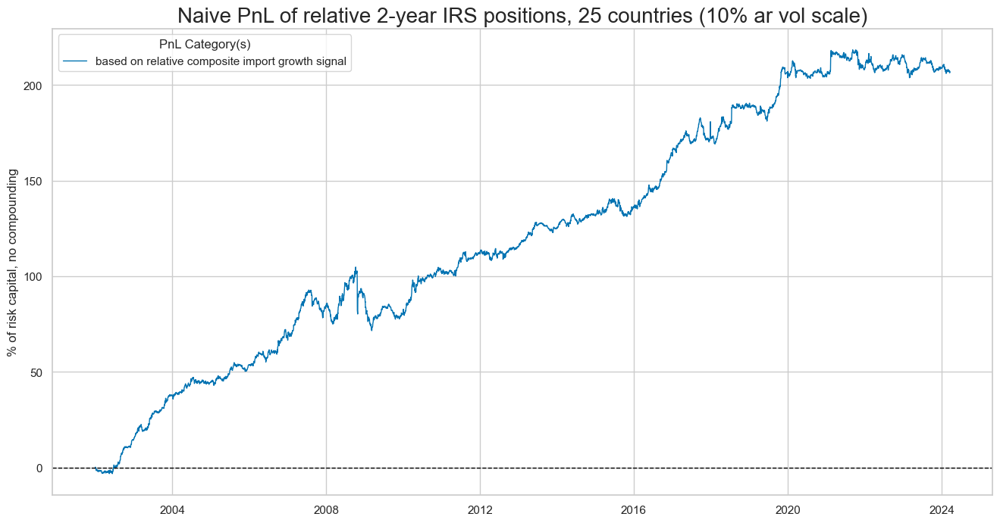

In [66]:
dix = dict_imr2

start = dix["start"]
cidx = dix["cidx"]

sigx = [dix["sig"]]
naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]

dict_labels = {"IMPORTSv2YLD_ZMPvGLB_PZN":  "based on relative composite import growth signal"}


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title=f"Naive PnL of relative 2-year IRS positions, {len(cidx)} countries (10% ar vol scale)",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

The economic value of the relative import growth score trading signal has been less seasonal than those based on directional signals. The consistent and robust performance of relative import growth as a trading signal reflects the diversification benefits of relative versus directional positions. The flip side is that this strategy requires higher leverage than a directional portfolio for the same return target, translating into higher transaction costs (not considered in this analysis).

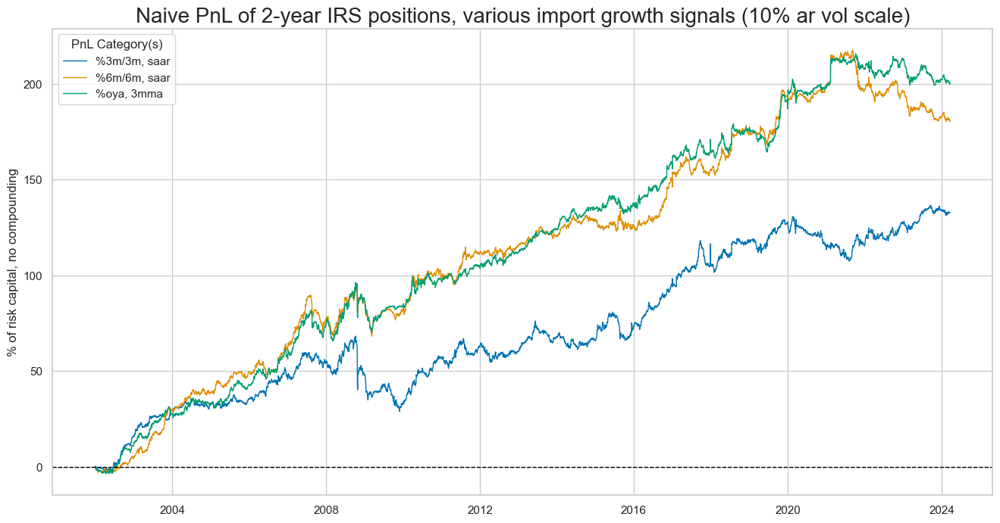

In [67]:
dix = dict_imr2

start = dix["start"]
sigx = dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]
dict_labels = {"IMPORTS_SA_P3M3ML3ARv2YLD_ZMPvGLB_PZN":  "%3m/3m, saar", 
               "IMPORTS_SA_P6M6ML6ARv2YLD_ZMPvGLB_PZN": "%6m/6m, saar",
               "IMPORTS_SA_P1M1ML12_3MMAv2YLD_ZMPvGLB_PZN": "%oya, 3mma"
               }


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnL of 2-year IRS positions, various import growth signals (10% ar vol scale)",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

In [68]:
dix = dict_imr2

start = dix["start"]
sigx = [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)
display(df_eval.transpose())

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_EQXR_NSA correl,Traded Months
xcat,,,,,,,,
IMPORTS_SA_P1M1ML12_3MMAv2YLD_ZMPvGLB_PZN,9.024776,10.0,0.902478,1.333001,-13.598539,-20.608053,0.031862,267
IMPORTS_SA_P3M3ML3ARv2YLD_ZMPvGLB_PZN,5.976771,10.0,0.597677,0.815473,-26.620099,-29.632662,0.053307,267
IMPORTS_SA_P6M6ML6ARv2YLD_ZMPvGLB_PZN,8.152148,10.0,0.815215,1.210329,-12.920113,-21.710373,0.007081,267
IMPORTSv2YLD_ZMPvGLB_PZN,9.326893,10.0,0.932689,1.3201,-20.453919,-27.731496,0.037032,267


The table above shows impressive strategy ratios: long-term Sharpe ratio of 1 and no equity market correlation.

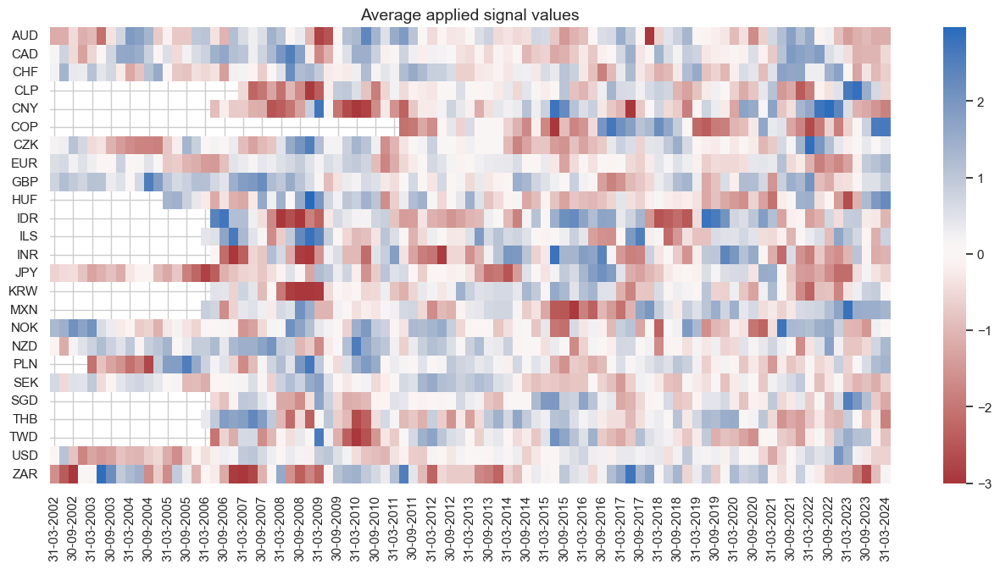

In [69]:
dix = dict_imr2

start = dix["start"]
sig = dix["sig"]
naive_pnl = dix["pnls"]

naive_pnl.signal_heatmap(pnl_name=sig + "_PZN", freq="q", start=start, figsize=(16, 7))

### Relative (5y)

#### Specs and panel test

A very similar analysis based on the 5-year maturities would have produced a little less value, with Sharpe 0.9, and with greater seasonality:

In [70]:
ximps_d5 = [x for x in ximps_zmp if "5YLD" in x]
for_sigs = ximps_d5
sigs = [s + "vGLB" for s in for_sigs]
ms = "IMPORTSv5YLD_ZMPvGLB"  # main signal
oths = list(set(sigs) - set([ms]))  # other signals

targ = "DU05YXR_VT10vGLB"
cidx = cids_dux
start = "2002-01-01"

dict_imr5 = {
    "sig": ms,
    "rivs": oths,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "srr": None,
    "pnls": None,
}

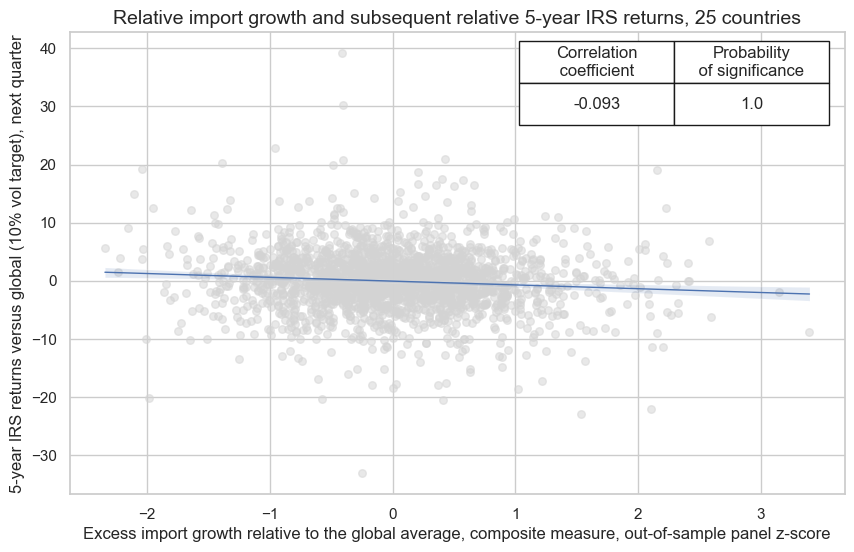

In [71]:
dix = dict_imr5

sig = dix["sig"]
targ = dix["targ"]
cidx = dix["cidx"]


crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start="2000-01-01",
    xcat_trims=[200, 40],  # extreme value distorts scatter
)
crx.reg_scatter(
    labels=False,
    coef_box="upper right",
    xlab="Excess import growth relative to the global average, composite measure, out-of-sample panel z-score",
    ylab="5-year IRS returns versus global (10% vol target), next quarter",
    title=f"Relative import growth and subsequent relative 5-year IRS returns, {len(cidx)} countries",
    size=(10, 6),
    prob_est="map",
)

#### Accuracy and correlation check

In [72]:
dix = dict_imr5

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    sig_neg=[True] + [True] * len(rivs),
    rets=targ,
    freqs="M",
    start=start,
)

dix["srr"] = srr

In [73]:
dix = dict_imr5
srrx = dix["srr"]
display(srrx.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Panel,0.515,0.515,0.521,0.508,0.522,0.508,0.062,0.000,0.035,0.000,0.515
Mean years,0.513,0.513,0.518,0.508,0.520,0.506,0.064,0.308,0.035,0.361,0.513
Positive ratio,0.696,0.696,0.522,0.696,0.696,0.478,0.870,0.609,0.739,0.565,0.696
Mean cids,0.515,0.515,0.518,0.508,0.522,0.509,0.055,0.375,0.036,0.414,0.515
Positive ratio,0.720,0.720,0.640,0.520,0.640,0.680,0.840,0.440,0.760,0.480,0.720


In [74]:
dix = dict_imr5
srrx = dix["srr"]
display(srrx.signals_table().sort_index().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
IMPORTS_SA_P1M1ML12_3MMAv5YLD_ZMPvGLB_NEG,0.509,0.509,0.509,0.508,0.516,0.501,0.061,0.000,0.026,0.003,0.509
IMPORTS_SA_P3M3ML3ARv5YLD_ZMPvGLB_NEG,0.519,0.519,0.522,0.508,0.526,0.512,0.032,0.012,0.029,0.001,0.519
IMPORTS_SA_P6M6ML6ARv5YLD_ZMPvGLB_NEG,0.513,0.513,0.518,0.508,0.520,0.505,0.063,0.000,0.027,0.002,0.513
IMPORTSv5YLD_ZMPvGLB_NEG,0.515,0.515,0.521,0.508,0.522,0.508,0.062,0.000,0.035,0.000,0.515


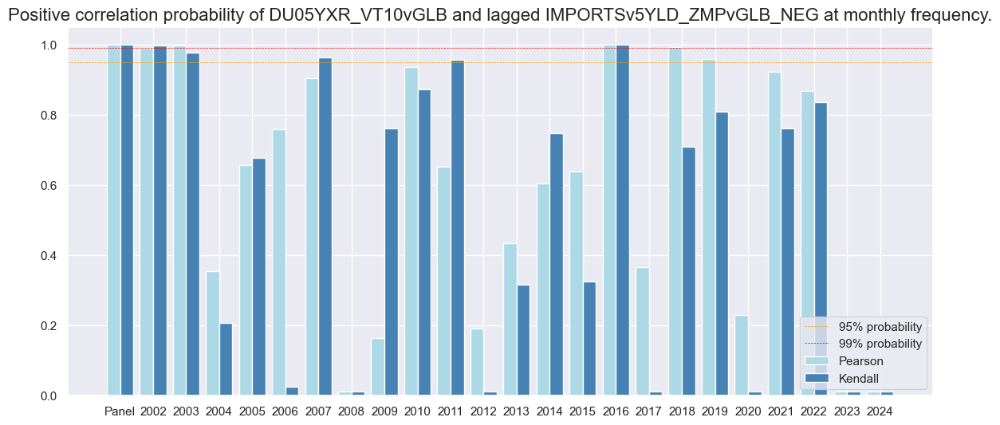

In [75]:
dix = dict_imr5
srrx = dix["srr"]
srrx.correlation_bars(
    type="years",
    title=None,
    size=(14, 6),
)

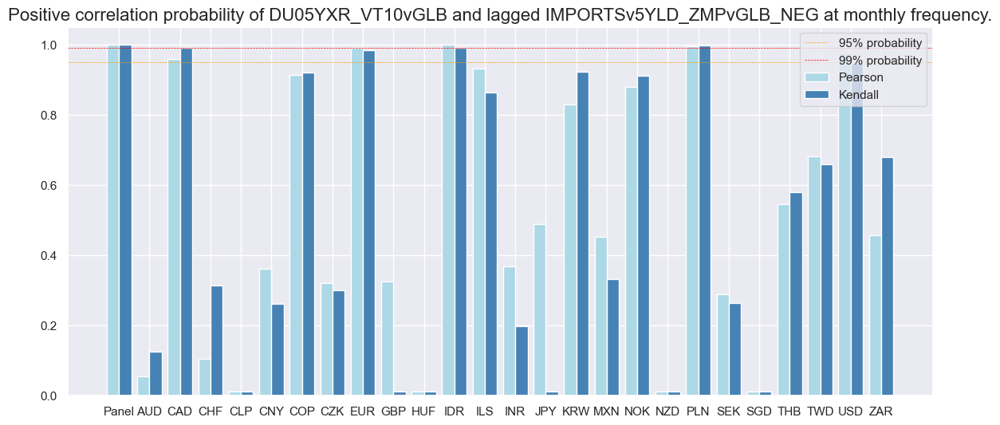

In [76]:
dix = dict_imr5
srrx = dix["srr"]
srrx.correlation_bars(
    type="cross_section",
    title=None,
    size=(14, 6),
)

#### Naive PnL

In [77]:
dix = dict_imr5

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]

start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    bms=["USD_DU05YXR_NSA", "USD_EQXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=True,
        sig_op="zn_score_pan",
        thresh=3,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

dix["pnls"] = naive_pnl

USD_DU05YXR_NSA has no observations in the DataFrame.


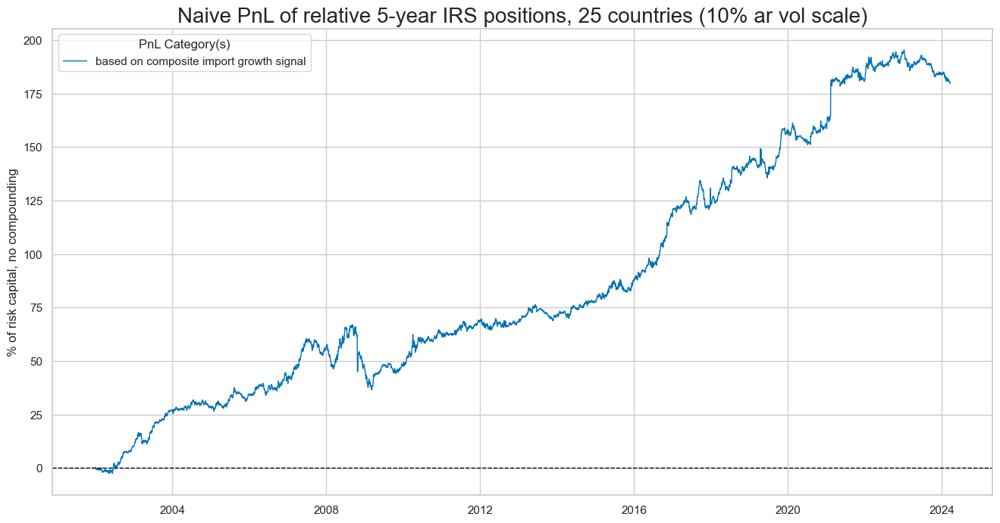

In [78]:
dix = dict_imr5

start = dix["start"]
cidx = dix["cidx"]

sigx = [dix["sig"]]
naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]
dict_labels = {"IMPORTSv5YLD_ZMPvGLB_PZN":  "based on composite import growth signal", 
               
               }


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title=f"Naive PnL of relative 5-year IRS positions, {len(cidx)} countries (10% ar vol scale)",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

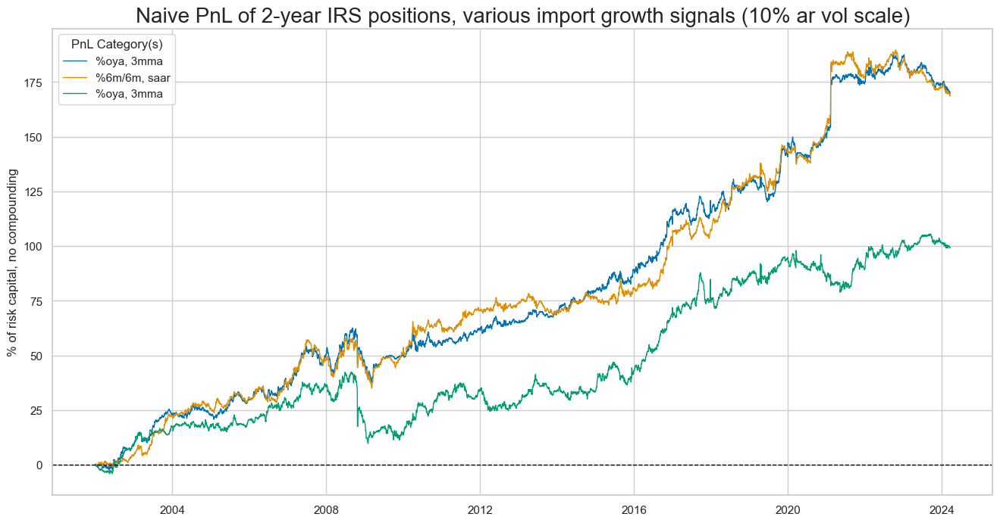

In [79]:
dix = dict_imr5

start = dix["start"]
sigx = dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]
dict_labels = {"IMPORTS_SA_P3M3ML3ARv5YLD_ZMPvGLB_PZN": "%oya, 3mma", 
               "IMPORTS_SA_P6M6ML6ARv5YLD_ZMPvGLB_PZN": "%6m/6m, saar",
               "IMPORTS_SA_P1M1ML12_3MMAv5YLD_ZMPvGLB_PZN": "%oya, 3mma"
               }



naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnL of 2-year IRS positions, various import growth signals (10% ar vol scale)",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

In [80]:
dix = dict_imr5

start = dix["start"]
sigx = [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)
display(df_eval.transpose())

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_EQXR_NSA correl,Traded Months
xcat,,,,,,,,
IMPORTS_SA_P1M1ML12_3MMAv5YLD_ZMPvGLB_PZN,7.66381,10.0,0.766381,1.244164,-13.214672,-23.599589,0.012708,267
IMPORTS_SA_P3M3ML3ARv5YLD_ZMPvGLB_PZN,4.476086,10.0,0.447609,0.616552,-23.541284,-30.594291,0.038311,267
IMPORTS_SA_P6M6ML6ARv5YLD_ZMPvGLB_PZN,7.620185,10.0,0.762019,1.258052,-10.174967,-21.002473,-0.003054,267
IMPORTSv5YLD_ZMPvGLB_PZN,8.117014,10.0,0.811701,1.240218,-19.274597,-29.124033,0.018949,267


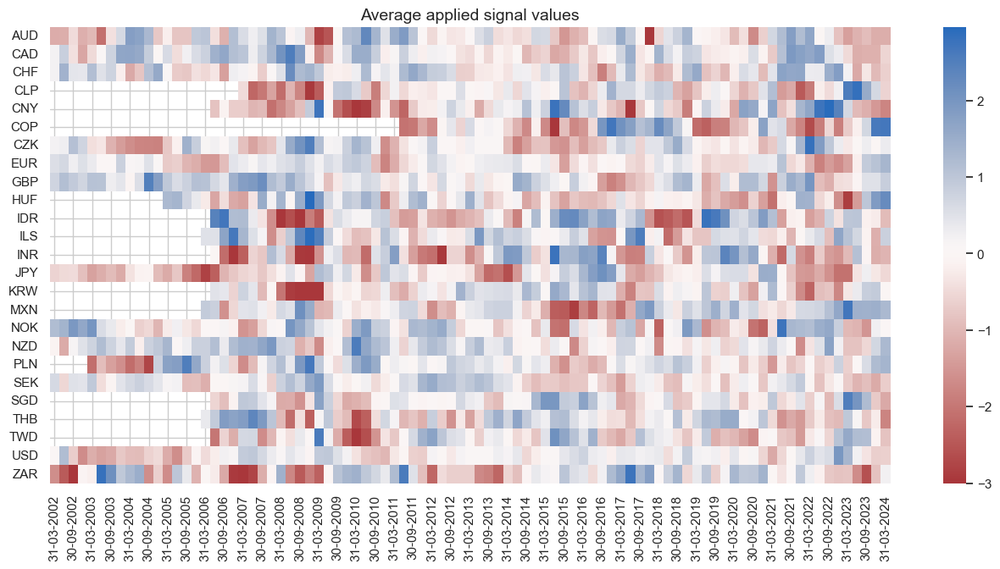

In [81]:
dix = dict_imr5

start = dix["start"]
sig = dix["sig"]
naive_pnl = dix["pnls"]

naive_pnl.signal_heatmap(pnl_name=sig + "_PZN", freq="q", start=start, figsize=(16, 7))